# Importing

## Modules

In [6]:
from F00_global_variables import *
os.chdir('/mnt/08_thymus_cell_atlas/')

sys.path.append('/mnt/thymus_atlas')
import scjp
from scjp import markers, model, draw, species

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=100, color_map='OrRd')
sc.logging.print_version_and_date()
%load_ext autoreload
%autoreload 2
%load_ext rpy2.ipython

version = 'HTA08.v01.A04.'

print('Version: '+version)

Running Scanpy 1.4.3 on 2019-10-08 14:34.
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython
Version: HTA08.v01.A04.


In [27]:
np.sum(mm_jptca.obs['name']=='jp')

18727

In [8]:
#mm_jptca = sc.read('HTA08.v01.A02.mouse_merged_annotated')
mm_jptca = sc.read('HTA08.v01.A04.mouse_jptca')

Only considering the two last: ['.A04', '.mouse_jptca'].


In [281]:
mm = sc.read('HTA08.v01.A04.mouse_jptcaido')
    
   # 'HTA08.v01.A02.mouse_total_final_v2')

Only considering the two last: ['.A02', '.mouse_total_final_v2'].


In [1]:
#hs = sc.read('HTA08.v01.A05.fig1_data_epi_updated') 
hs = sc.read('HTA08.v01.A05.fig1_data_vdj_added')

NameError: name 'sc' is not defined

In [47]:
TEC_hs = sc.read('HTA08.v01.A05.human_TECs')

Only considering the two last: ['.A05', '.human_TECs'].


In [25]:
ST_mm = sc.read('HTA08.v01.A02.ido_annotated')

Only considering the two last: ['.A02', '.ido_annotated'].


In [295]:
mm_jptca.obs['Age'] = [y.split('_')[2] if x=='n/a' else x for x,y in zip(mm_jptca.obs['age'],mm_jptca.obs['Sample'])]

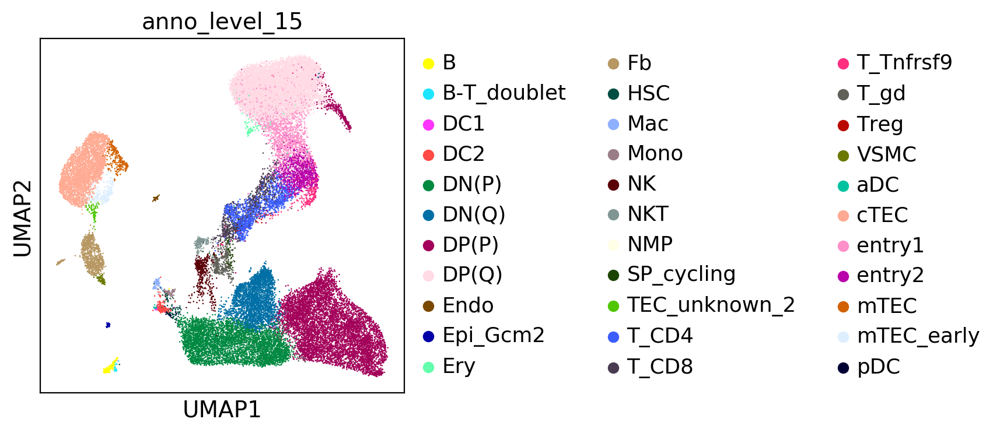

In [12]:
scjp.us(mm_jptca,'anno_level_15')

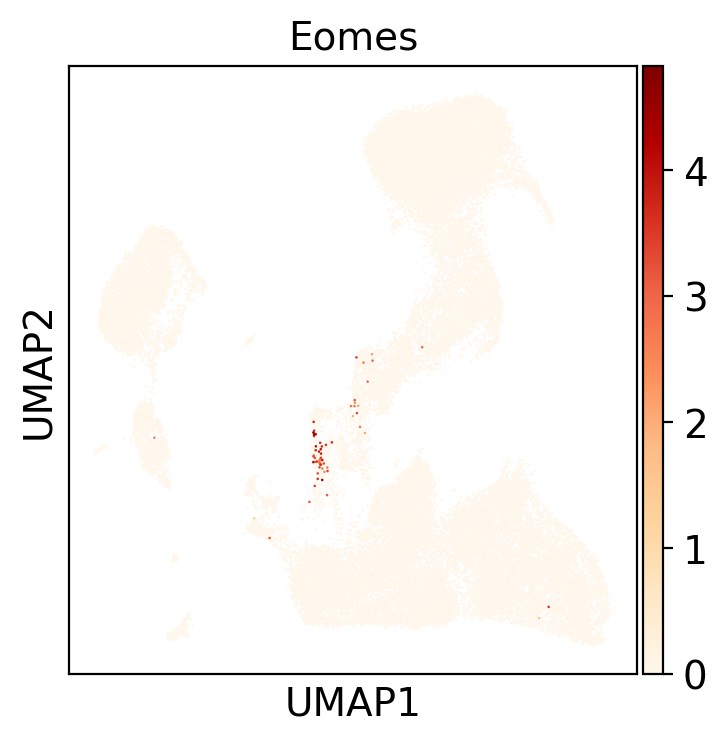

In [24]:
scjp.us(mm_jptca,'Eomes')

... storing 'Age' as categorical


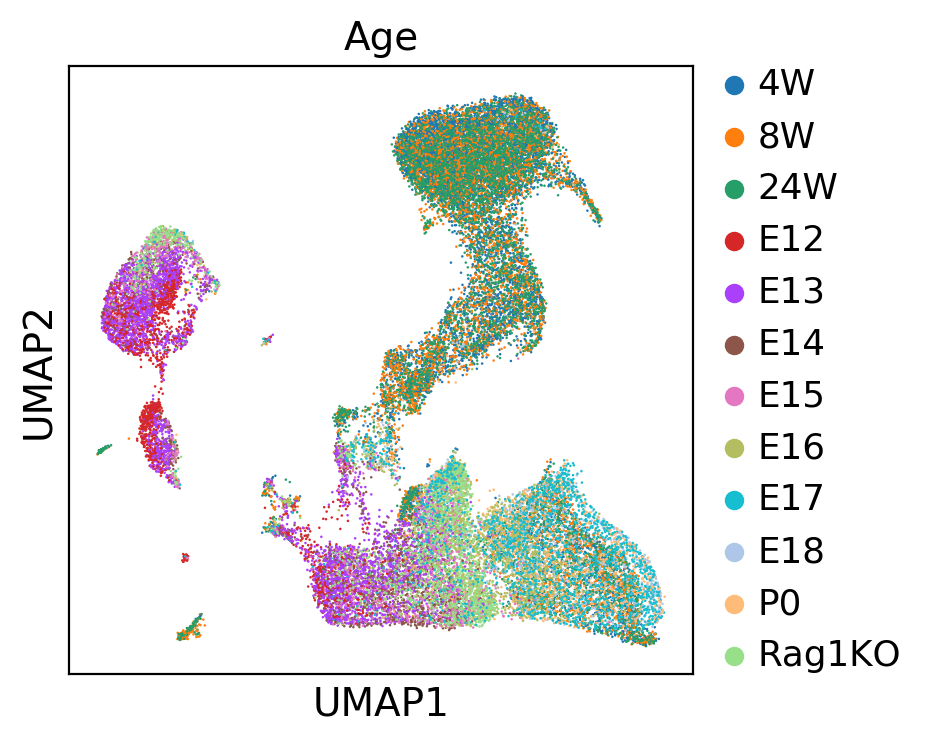

In [296]:
scjp.us(mm_jptca,'Age')

In [349]:
ann = scjp.annotater(mm_jptca,'anno_level_12',old_label = 'anno_level_4')

In [350]:
ann.update(mm_jptca,'anno_level_12','DN','DN(Q)')

In [351]:
model.update_label(mm_jptca,'anno_level_12',mm_jptca,'anno_level_11','anno_level_13',exclude=['n/a'])

In [365]:
ann = scjp.annotater(mm_jptca,'anno_level_14',old_label = 'anno_level_13')

In [367]:
ann.update(mm_jptca,'anno_level_13','T_gd_1,T_gd_2','T_gd')

In [415]:
model.update_label(mm,'anno_level_15',mm_jptca,'anno_level_14','anno_level_15',exclude=['n/a'])

In [420]:
ann = scjp.annotater(mm_jptca,'anno_level_15',old_label = 'anno_level_15')
ann.update(mm_jptca,'anno_level_15','DN','DN(Q)')

... storing 'anno_level_15' as categorical


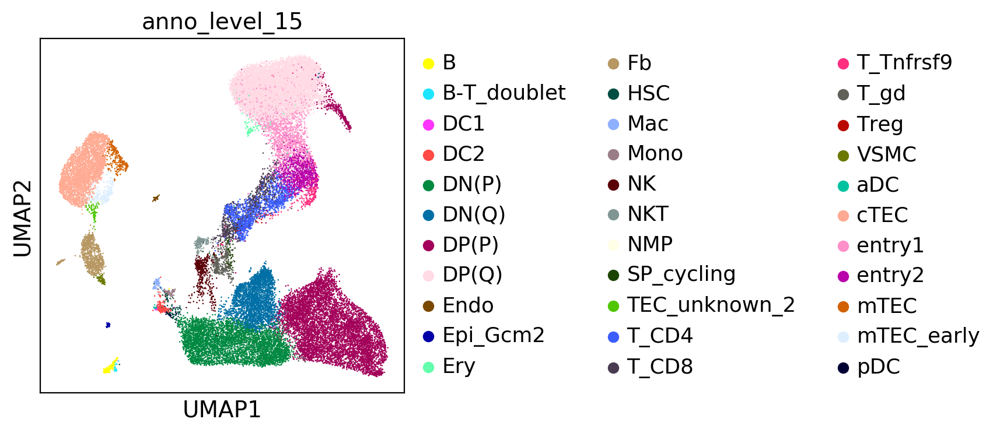

In [421]:
scjp.us(mm_jptca,'anno_level_15')

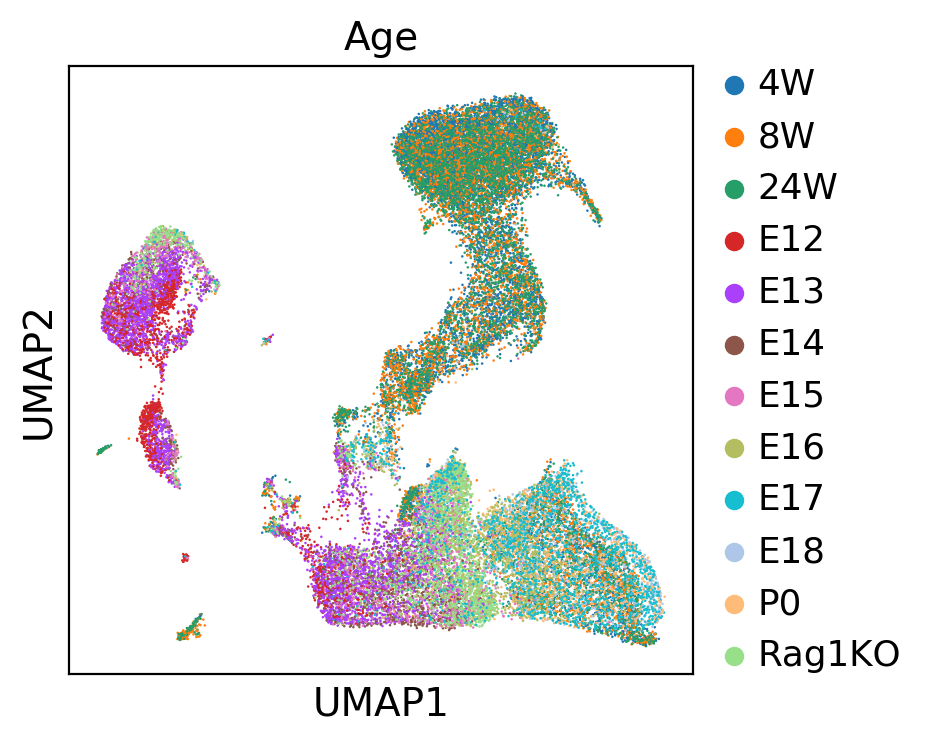

In [425]:
scjp.us(mm_jptca,'Age')

In [422]:
scjp.write(mm_jptca,version,'mouse_jptca')

Only considering the two last: ['.A04', '.mouse_jptca'].
HTA08_v01_A04_mouse_jptca = 'HTA08.v01.A04.mouse_jptca'


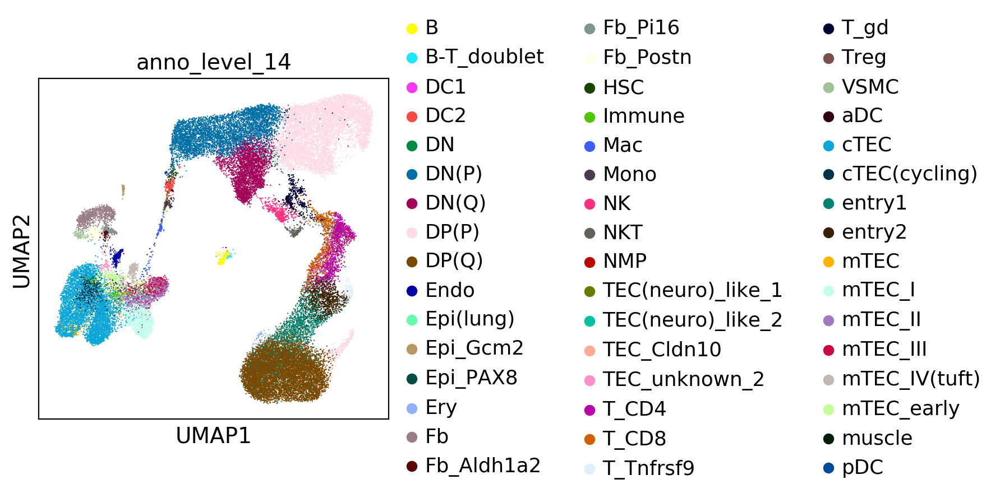

In [375]:
scjp.us(mm,'anno_level_14')

In [376]:
model.update_label(mm_jptca,'anno_level_14',mm,'anno_level_14','anno_level_15',include=['T_CD4','T_CD8','T_gd','SP_cycling',
                                                                                        'Treg','NKT','NK'
                                                                                       ])

... storing 'anno_level_15' as categorical


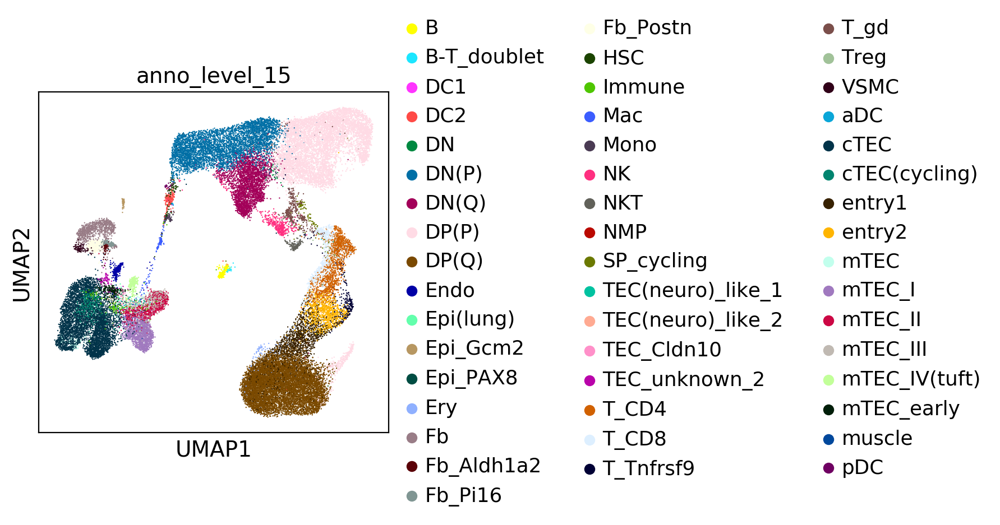

In [377]:
scjp.us(mm,'anno_level_15')

In [378]:
scjp.write(mm,version,'mouse_jptcaido')

Only considering the two last: ['.A04', '.mouse_jptcaido'].
HTA08_v01_A04_mouse_jptcaido = 'HTA08.v01.A04.mouse_jptcaido'


In [379]:
mm_jp = sc.read('HTA08.v01.A02.mouse_4w8w24w')

Only considering the two last: ['.A02', '.mouse_4w8w24w'].


In [380]:
mm_jp

AnnData object with n_obs × n_vars = 19663 × 2927 
    obs: 'Sample', 'n_counts', 'n_genes', 'donor', 'organ', 'sort', 'method', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'Cycle_score', 'isCycle', 'scrublet_doublets', 'leiden', 'anno_pred', 'anno_level_1', 'anno_level_2', 'anno_level_4', 'anno_level_5'
    var: 'GeneName', 'GeneID', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Sample_colors', 'anno_level_2_colors', 'anno_level_5_colors', 'anno_pred_colors', 'leiden', 'leiden_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [388]:
scjp.model.update_label(mm,'anno_level_15',mm_jp,'anno_level_5','anno_level_15')

In [408]:
scjp.write(mm_jp,version,'mouse_jp')

Only considering the two last: ['.A04', '.mouse_jp'].
HTA08_v01_A04_mouse_jp = 'HTA08.v01.A04.mouse_jp'


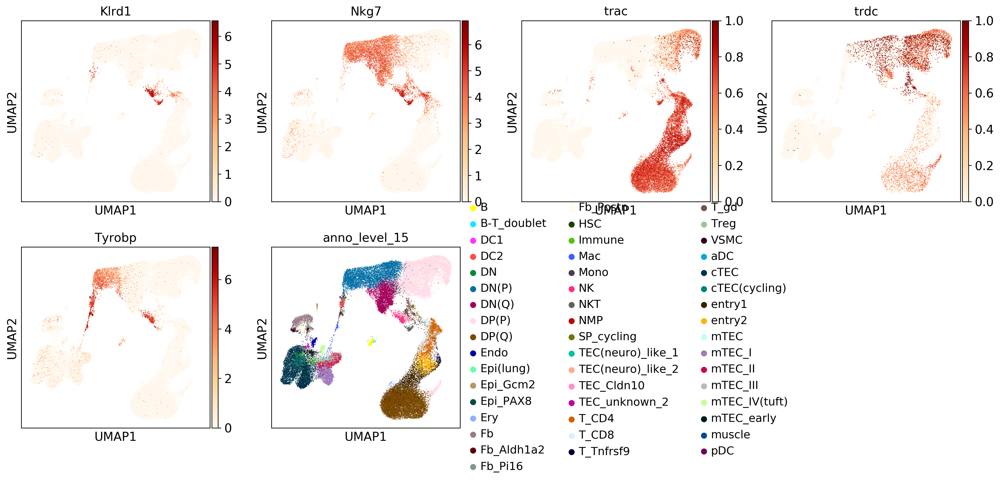

In [414]:
scjp.us(mm,'Klrd1,Nkg7,trac,trdc,Tyrobp,anno_level_15')

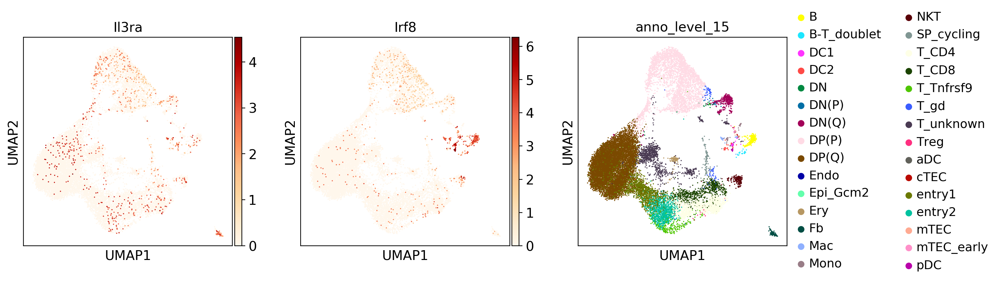

In [412]:
scjp.us(mm_jp,'Il3ra,Irf8,anno_level_15')§

## make humanised mouse data

In [431]:
humanised_names = [scjp.species.mouse_to_human(x) for x in mm.raw.var_names]

In [432]:
mm_h = sc.AnnData(mm.raw.X,var=mm.raw.var,obs=mm.obs)

In [433]:
mm_h.var_names = humanised_names

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [434]:
mm_h.raw = mm_h

In [435]:
mm_c, hs_c = model.get_common_var_raw(mm_h,hs)

calculating a...
calculating b...


In [10]:
ido = mm_c[mm_c.obs['name']=='ido']

In [11]:
mm_strom = ido[~ido.obs['anno_level_14'].isin('Epi_PAX8,TEC_Cldn10,Mac,Immune,Ery,Epi(lung),cTEC(cycling),muscle'.split(','))]

In [12]:
strom_list = ['Fb_1', 'Fb_2', 'cTEC',
 'mTEC','VSMC','TEC(myo)',
 'TEC(neuro)','Lymph','Endo']

In [13]:
c1 = hs_c.obs['anno_final_v1'].isin(strom_list)
c2 = hs_c.obs['Stage'].isin('F1,F2,F3,F4,P1'.split(','))

hs_strom = hs_c[c1&c2]

In [14]:
hs_strom.obs['anno_merge'] = [x+'_hs' for x in hs_strom.obs['anno_final_v4']]
mm_strom.obs['anno_merge'] = [x+'_mm' for x in mm_strom.obs['anno_level_14']]

Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.obs` of view, making a copy.


In [15]:
ad = {}
ad['hs'] = hs_strom
ad['mm'] = mm_strom

In [16]:
strom = scjp.merge_matrix(ad)

25885
Sample
n_counts
n_genes
donor
organ
sort
method
file
mito
doublet_scores
predicted_doublets
name
source
birth
batch
bbk
Donor
Order
Age
Gender
Source
Stage
Stage2
Cycle_score
isCycle
scrublet_doublets
is_Fig1
is_file_Fig1
true_doublets
missed_doublets_scbl
missed_doublets_jp
anno_doublet_4_scores
anno_doublet_5_scores
anno_doublet_6_scores
anno_doublet_7_scores
anno_doublet_8_scores
anno_doublet_T_scores
dbl_jp_method
broad_doublets
anno_pred
anno_fig1_detailed.replaced.1
anno_fig1_detailed
anno_predict_B
anno_predict_fig1.replaced.1
anno_predict_fig1
anno_final_v1
anno_final_v2_epi
Anno_level_1
Anno_level_2
Anno_level_3
Anno_level_4
Anno_level_5
Anno_level_fig1
Anno_level_Staal
donor_method
factor
anno_final_v3
anno_final_v4
anno_final_v5
anno_merge
leiden
anno_level_1
anno_level_2
anno_level_4
anno_level_5
anno_level_6
age
anno_level_7
anno_level_8
anno_level_9
trac.replaced.1
trac.replaced.2
trdc.replaced.1
trdc.replaced.2
trac.replaced.3
trac.replaced.4
trdc.replaced.3
trdc.r

## mouse to human

creating lr model...


/home/ubuntu/.local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

/home/ubuntu/.local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning:

Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.



making lr prediction...


Trying to set attribute `.obs` of view, making a copy.


updating lr to adata...


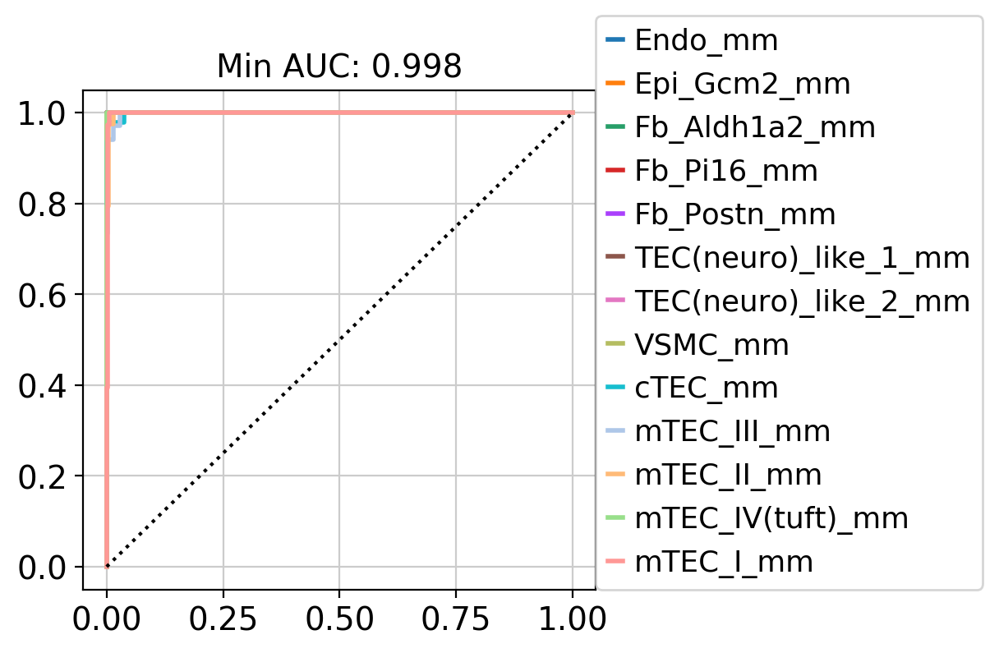

In [17]:
lr_mouse = model.transfer_annotation_jp(strom[strom.obs['name']=='mm'],'anno_merge',
                                       strom[strom.obs['name']=='hs'],'anno_pred',raw=False)

In [18]:
proba_MtH = lr_mouse.predict_proba(strom.X)

In [19]:
a = proba_MtH[strom.obs['anno_merge']=='Fb_2_hs'].mean(axis=0)
b = lr_mouse.classes_

sorted([(b1,a1) for a1,b1 in zip(a,b)],key=lambda x:-x[1])

[('Fb_Pi16_mm', 0.8567406515247997),
 ('cTEC_mm', 0.0694764289037756),
 ('mTEC_II_mm', 0.061549590060935716),
 ('Fb_Postn_mm', 0.007620475827719264),
 ('mTEC_I_mm', 0.002088754664894203),
 ('Fb_Aldh1a2_mm', 0.0014426540706551556),
 ('Endo_mm', 0.000446267931385009),
 ('VSMC_mm', 0.0004286833907580007),
 ('TEC(neuro)_like_2_mm', 0.0001182101321372639),
 ('Epi_Gcm2_mm', 6.614261335614648e-05),
 ('mTEC_IV(tuft)_mm', 1.7699420322477264e-05),
 ('TEC(neuro)_like_1_mm', 4.312289742170316e-06),
 ('mTEC_III_mm', 1.2916951824894244e-07)]

## human to mouse

creating lr model...


Trying to set attribute `.obs` of view, making a copy.


making lr prediction...
updating lr to adata...


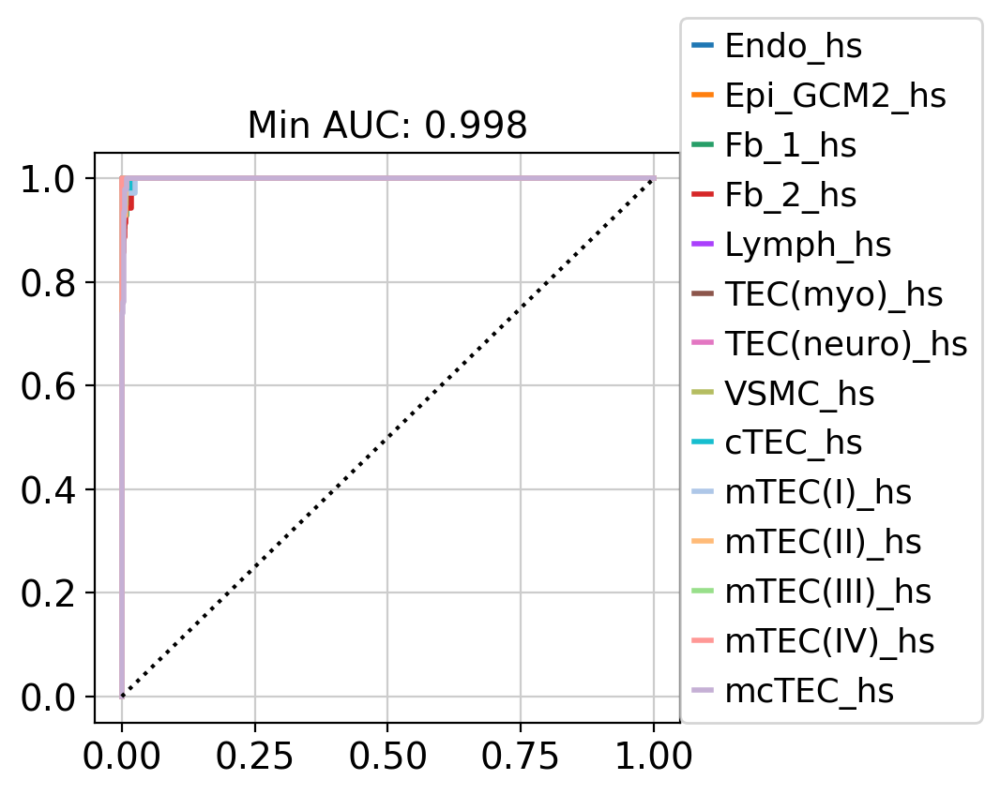

In [20]:
c1 = strom.obs['name']=='hs'
lr_human = model.transfer_annotation_jp(strom[c1],'anno_merge',
                                       strom[strom.obs['name']=='mm'],'anno_pred',
                                        raw=False,exclude=['TEC(cycling)_hs'])

In [21]:
proba_HtM = lr_human.predict_proba(strom.X)

In [22]:
a = proba_HtM[strom.obs['anno_merge']=='TEC(neuro)_like_2_mm'].mean(axis=0)
b = lr_human.classes_

sorted([(b1,a1) for a1,b1 in zip(a,b)],key=lambda x:-x[1])

[('mTEC(II)_hs', 0.226415082053936),
 ('mTEC(IV)_hs', 0.17952332072150246),
 ('TEC(neuro)_hs', 0.0947417740203304),
 ('Epi_GCM2_hs', 0.08578986797192474),
 ('mTEC(III)_hs', 0.07485163732153241),
 ('Lymph_hs', 0.07132250157674223),
 ('Endo_hs', 0.050773175436444426),
 ('cTEC_hs', 0.0478294910967043),
 ('TEC(myo)_hs', 0.04253583016619661),
 ('VSMC_hs', 0.030478780238142374),
 ('Fb_2_hs', 0.02920928282768378),
 ('mTEC(I)_hs', 0.02831238326739064),
 ('mcTEC_hs', 0.02591277035988868),
 ('Fb_1_hs', 0.012304102941580986)]

In [23]:
HtM_mean_proba =[]
for mm_label in lr_mouse.classes_:
    HtM_mean_proba.append(proba_HtM[strom.obs['anno_merge']==mm_label].mean(axis=0))
HtM_mean_proba = np.vstack(HtM_mean_proba)  

In [24]:
MtH_mean_proba =[]
for hs_label in lr_human.classes_:
    MtH_mean_proba.append(proba_MtH[strom.obs['anno_merge']==hs_label].mean(axis=0))
MtH_mean_proba = np.vstack(MtH_mean_proba)      

In [25]:
HtM_mean_proba.shape

(13, 14)

In [26]:
MtH_mean_proba.shape

(14, 13)

In [27]:
lr_mouse.classes_

array(['Endo_mm', 'Epi_Gcm2_mm', 'Fb_Aldh1a2_mm', 'Fb_Pi16_mm',
       'Fb_Postn_mm', 'TEC(neuro)_like_1_mm', 'TEC(neuro)_like_2_mm',
       'VSMC_mm', 'cTEC_mm', 'mTEC_III_mm', 'mTEC_II_mm',
       'mTEC_IV(tuft)_mm', 'mTEC_I_mm'], dtype=object)

In [28]:
lr_human.classes_

array(['Endo_hs', 'Epi_GCM2_hs', 'Fb_1_hs', 'Fb_2_hs', 'Lymph_hs',
       'TEC(myo)_hs', 'TEC(neuro)_hs', 'VSMC_hs', 'cTEC_hs', 'mTEC(I)_hs',
       'mTEC(II)_hs', 'mTEC(III)_hs', 'mTEC(IV)_hs', 'mcTEC_hs'],
      dtype=object)

In [29]:
hs_order = [ 'Fb_1_hs', 'Fb_2_hs', 'VSMC_hs','Endo_hs', 'Lymph_hs', 'cTEC_hs','mcTEC_hs', 'mTEC(I)_hs', 'mTEC(II)_hs',
       'mTEC(III)_hs', 'mTEC(IV)_hs', 'TEC(myo)_hs','TEC(neuro)_hs','Epi_GCM2_hs']
hs_index = [list(lr_human.classes_).index(x) for x in hs_order]

In [30]:
mm_order = [ 'Fb_Pi16_mm', 'Fb_Postn_mm','Fb_Aldh1a2_mm', 'VSMC_mm','Endo_mm',
       'cTEC_mm','mTEC_I_mm', 'mTEC_II_mm',  'mTEC_III_mm','mTEC_IV(tuft)_mm', 'TEC(neuro)_like_1_mm',
            'TEC(neuro)_like_2_mm','Epi_Gcm2_mm']
mm_index = [list(lr_mouse.classes_).index(x) for x in mm_order]

02_Output/HTA08.v01.A04.FigS1_epi_mouse_comp_HtM.pdf


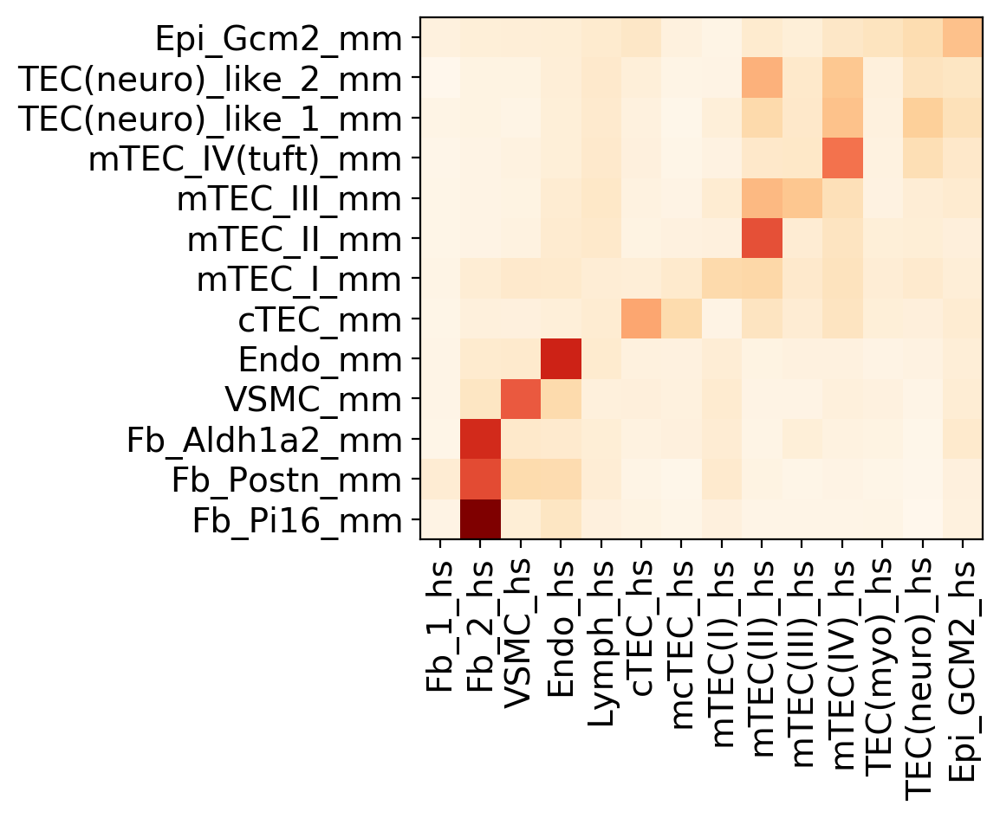

In [31]:
fig, ax = plt.subplots(figsize=(6,6))
im = ax.imshow(HtM_mean_proba[mm_index][:,hs_index])
plt.grid(False)

xlabel = lr_human.classes_[hs_index]
ylabel = lr_mouse.classes_[mm_index]

ax.set_xticks(np.arange(len(xlabel)))
ax.set_yticks(np.arange(len(ylabel)+1))

plt.ylim(-0.5,len(ylabel)-0.5)

ax.set_xticklabels(xlabel)
ax.set_yticklabels(ylabel)

plt.setp(ax.get_xticklabels(),rotation=90)

fig.tight_layout()
plt.grid(False)
scjp.jp_save_fig(version,'FigS1_epi_mouse_comp_HtM',fig_folder=fig_folder)

02_Output/HTA08.v01.A04.FigS1_epi_mouse_comp_MtH.pdf


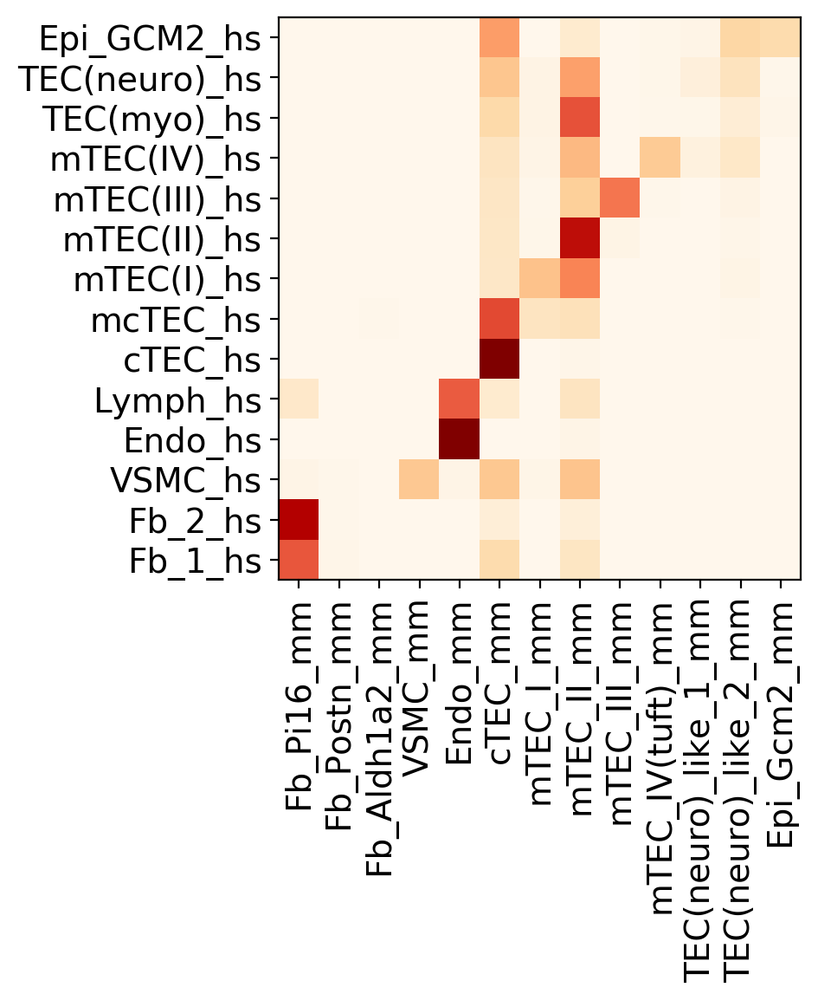

In [32]:
fig, ax = plt.subplots(figsize=(6,6))
im = ax.imshow(MtH_mean_proba[hs_index][:,mm_index])
plt.grid(False)

xlabel = lr_mouse.classes_[mm_index]
ylabel = lr_human.classes_[hs_index]

ax.set_xticks(np.arange(len(xlabel)))
ax.set_yticks(np.arange(len(ylabel)+1))

plt.ylim(-0.5,len(ylabel)-0.5)

ax.set_xticklabels(xlabel)
ax.set_yticklabels(ylabel)

plt.setp(ax.get_xticklabels(),rotation=90)

fig.tight_layout()
plt.grid(False)
scjp.jp_save_fig(version,'FigS1_epi_mouse_comp_MtH',fig_folder=fig_folder)

In [33]:
multi = MtH_mean_proba[hs_index][:,mm_index]*HtM_mean_proba[mm_index][:,hs_index].T

02_Output/HTA08.v01.A04.FigS1_epi_mouse_comp_multi.pdf


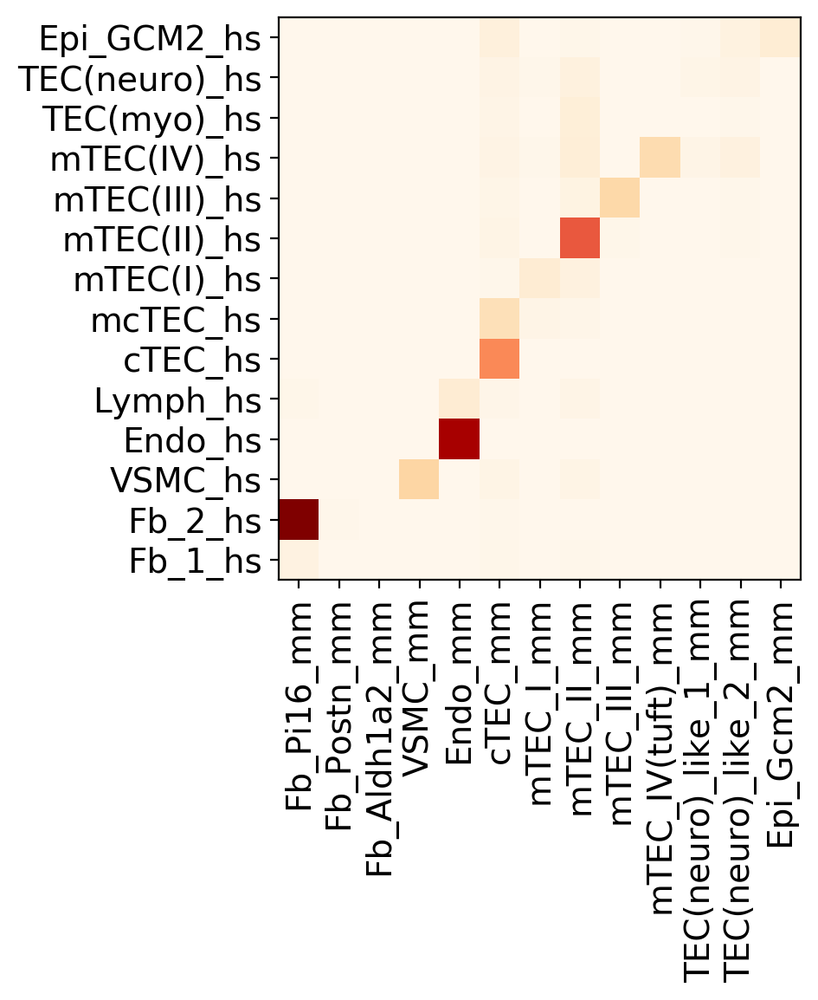

In [34]:
fig, ax = plt.subplots(figsize=(6,6))
im = ax.imshow(multi)
plt.grid(False)

xlabel = lr_mouse.classes_[mm_index]
ylabel = lr_human.classes_[hs_index]

ax.set_xticks(np.arange(len(xlabel)))
ax.set_yticks(np.arange(len(ylabel)+1))

plt.ylim(-0.5,len(ylabel)-0.5)

ax.set_xticklabels(xlabel)
ax.set_yticklabels(ylabel)

plt.setp(ax.get_xticklabels(),rotation=90)

fig.tight_layout()
plt.grid(False)
scjp.jp_save_fig(version,'FigS1_epi_mouse_comp_multi',fig_folder=fig_folder)

In [35]:
isTEC = ['mTEC(IV)_hs',
 'Epi_GCM2_hs',
 'Epi_Gcm2_mm',
'TEC(cycling)_hs',
 'TEC(myo)_hs',
 'TEC(neuro)_hs',
 'TEC(neuro)_like_1_mm',
 'TEC(neuro)_like_2_mm',
 'cTEC_hs',
 'cTEC_mm',
 'mTEC(I)_hs',
 'mTEC(II)_hs',
 'mTEC(III)_hs',
 'mTEC_III_mm',
 'mTEC_II_mm',
 'mTEC_IV(tuft)_mm',
 'mTEC_I_mm',
 'mcTEC_hs']

In [36]:
TEC = strom[strom.obs['anno_merge'].isin(isTEC)]

In [37]:
TEC.raw = TEC

In [80]:
TEC.obs['isTuft'] = TEC.obs['anno_merge'].isin('mTEC_IV(tuft)_mm,mTEC(IV)_hs'.split(','))
TEC.obs['ismTECI'] = TEC.obs['anno_merge'].isin('mTEC(I)_hs,mTEC_I_mm'.split(','))
TEC.obs['ismTECII'] = TEC.obs['anno_merge'].isin('mTEC(II)_hs,mTEC_II_mm'.split(','))
TEC.obs['ismcTEC'] = TEC.obs['anno_merge'].isin('mcTEC_hs,mTEC_I_mm'.split(','))
TEC.obs['isGCM2'] = TEC.obs['anno_merge'].isin('Epi_GCM2_hs,Epi_Gcm2_mm'.split(','))
TEC.obs['isNeuro'] = TEC.obs['anno_merge'].isin('TEC(neuro)_hs,mTEC_II_mm'.split(','))
TEC.obs['isNeuro2'] = TEC.obs['anno_merge'].isin('TEC(neuro)_hs,TEC(neuro)_like_1_mm,TEC(neuro)_like_2_mm,mTEC_IV(tuft)_mm'.split(','))
TEC.obs['ismyo'] = TEC.obs['anno_merge'].isin('TEC(myo)_hs,mTEC_II_mm'.split(','))
TEC.obs['ismTECIII'] = TEC.obs['anno_merge'].isin('mTEC(III)_hs,mTEC_III_mm'.split(','))
TEC.obs['iscTEC'] = TEC.obs['anno_merge'].isin('cTEC_hs,cTEC_mm'.split(','))

In [81]:
TEC_hs = TEC[TEC.obs['name']=='hs']
TEC_hs.raw = TEC_hs

In [82]:
TEC_mm = TEC[TEC.obs['name']=='mm']
TEC_mm.raw = TEC_mm

In [138]:
fc_tec = defaultdict(lambda : defaultdict())

In [141]:
for ct in ['isTuft','ismTECI','ismcTEC','isGCM2','isNeuro','isNeuro2','iscTEC','ismTECII','ismTECIII','ismyo','isNeuro2']:
    print(ct)
    fc_tec[ct]['hs'] = markers.volcano_plot(TEC_hs,ct,True,False)
    fc_tec[ct]['mm'] = markers.volcano_plot(TEC_mm,ct,True,False)

isTuft
ismTECI
ismcTEC
isGCM2
isNeuro
isNeuro2
iscTEC
ismTECII
ismTECIII
ismyo
isNeuro2


02_Output/HTA08.v01.A04.FigS1_epi_isTuft.pdf


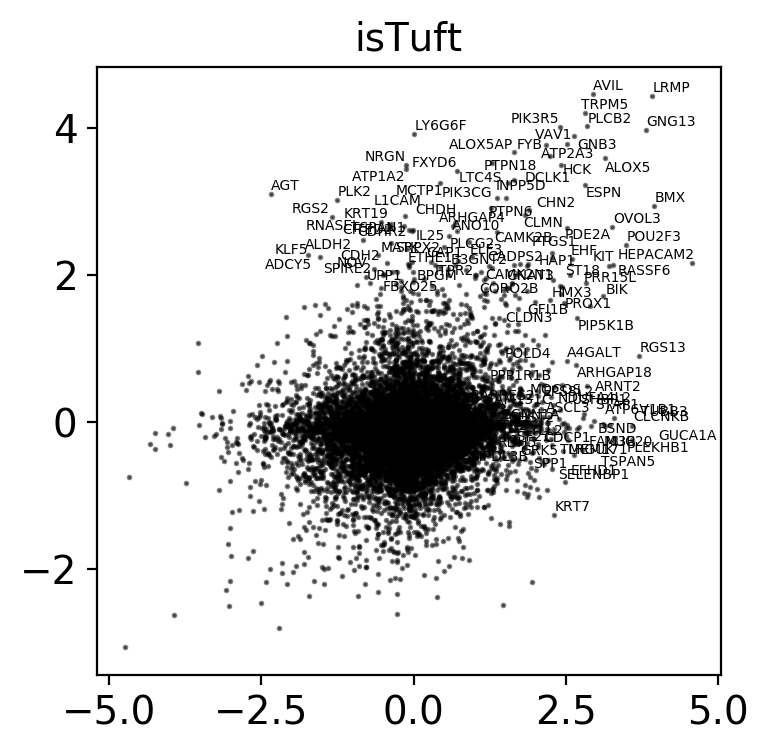

02_Output/HTA08.v01.A04.FigS1_epi_ismTECI.pdf


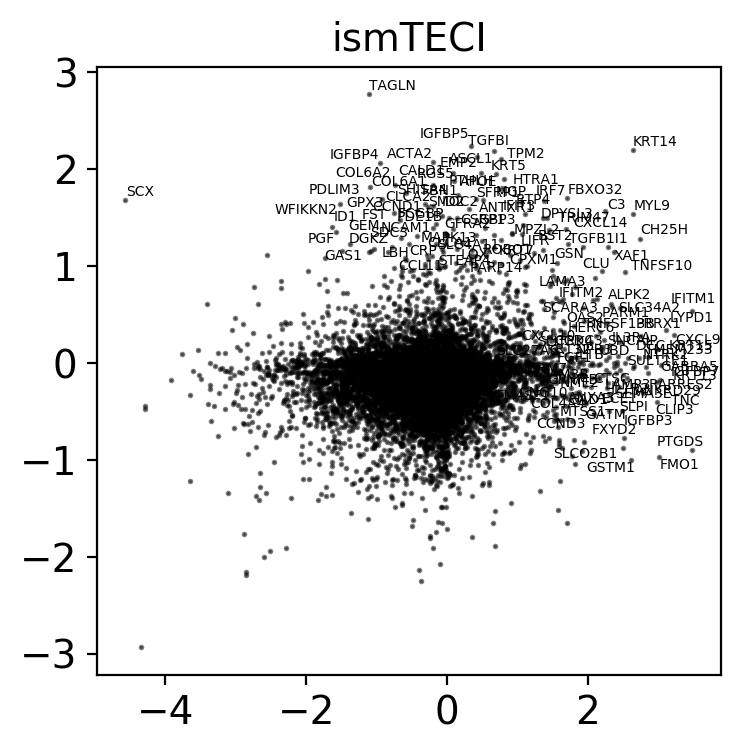

02_Output/HTA08.v01.A04.FigS1_epi_ismcTEC.pdf


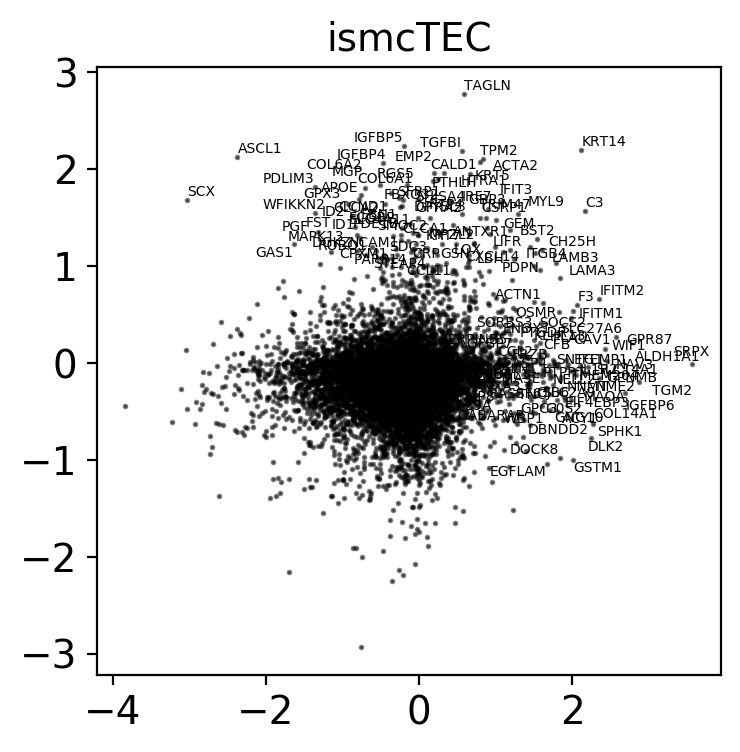

02_Output/HTA08.v01.A04.FigS1_epi_isGCM2.pdf


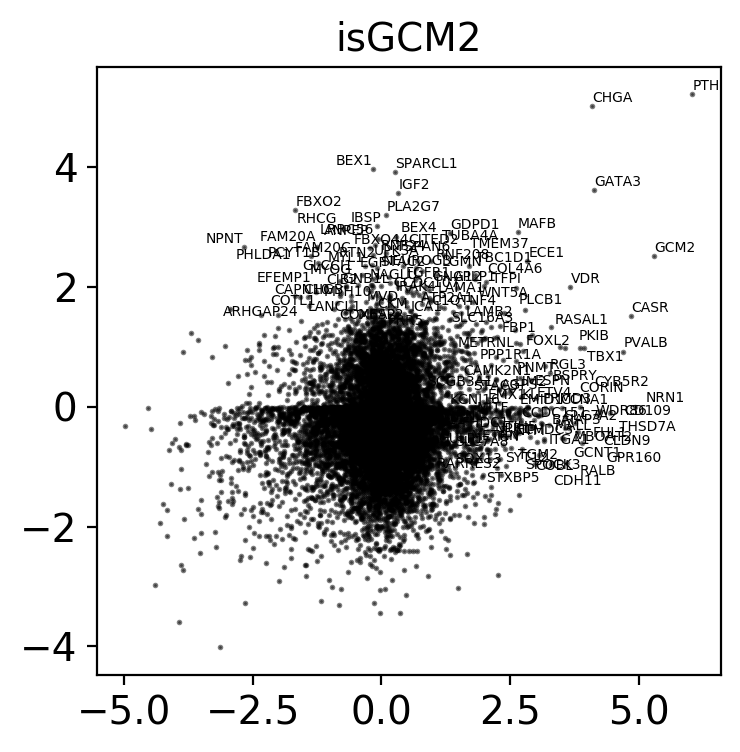

02_Output/HTA08.v01.A04.FigS1_epi_isNeuro.pdf


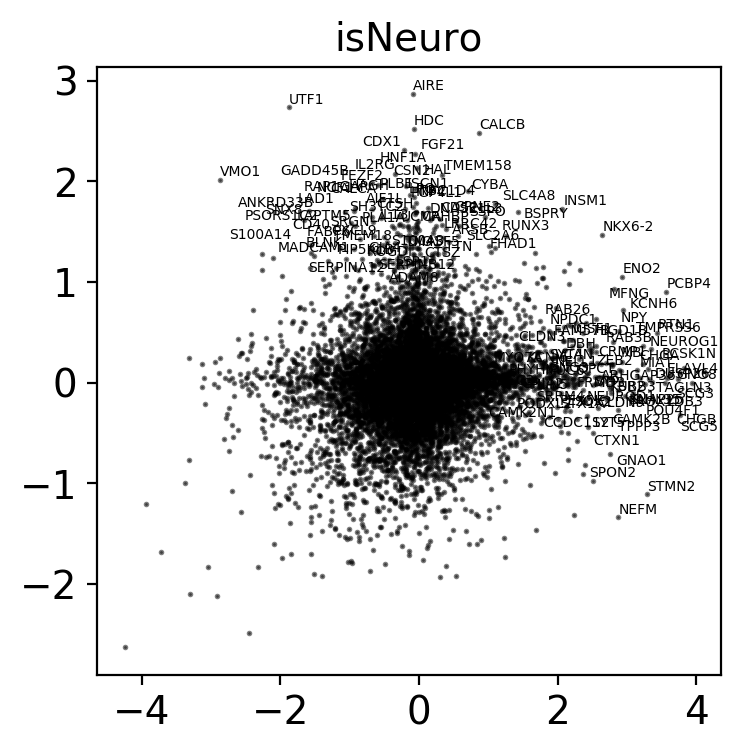

02_Output/HTA08.v01.A04.FigS1_epi_isNeuro2.pdf


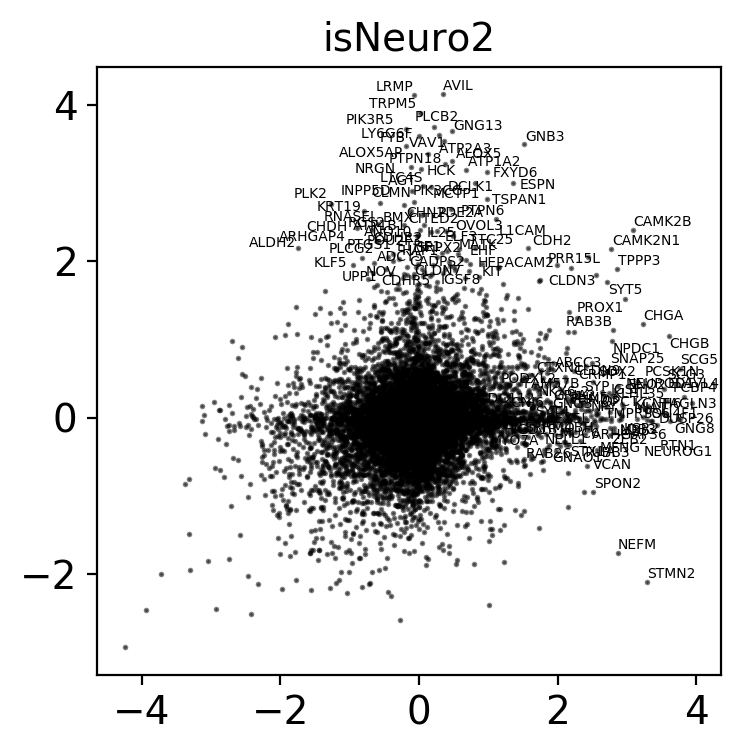

02_Output/HTA08.v01.A04.FigS1_epi_iscTEC.pdf


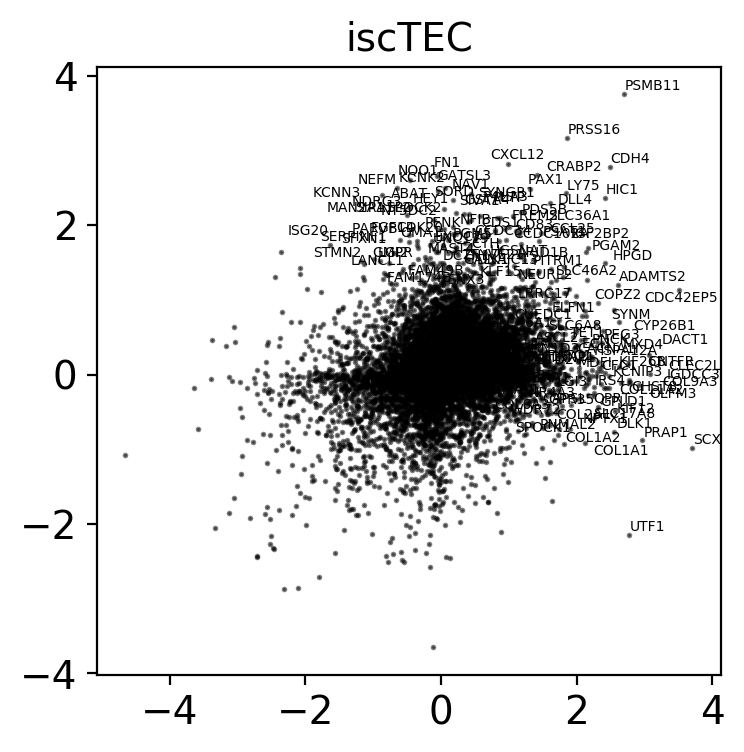

02_Output/HTA08.v01.A04.FigS1_epi_ismTECII.pdf


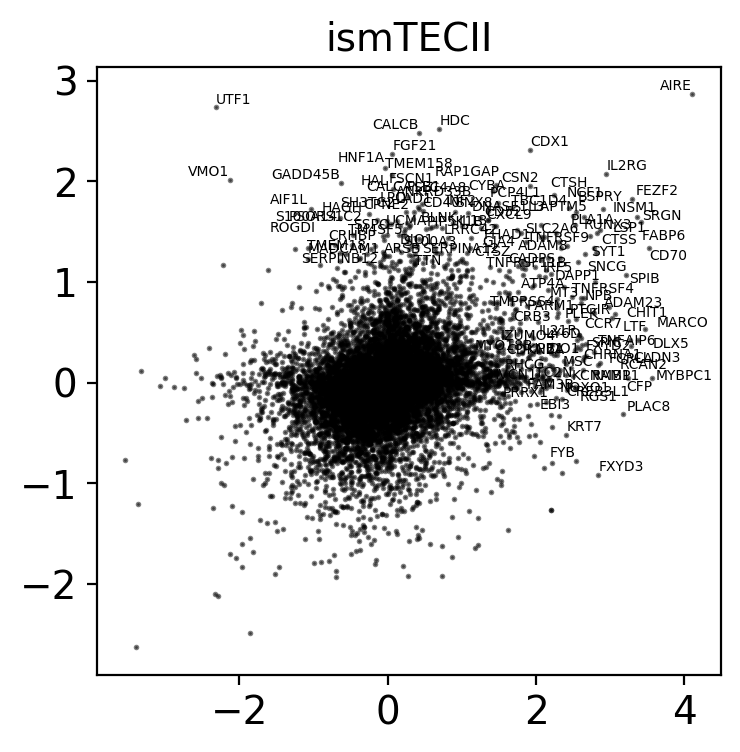

02_Output/HTA08.v01.A04.FigS1_epi_ismTECIII.pdf


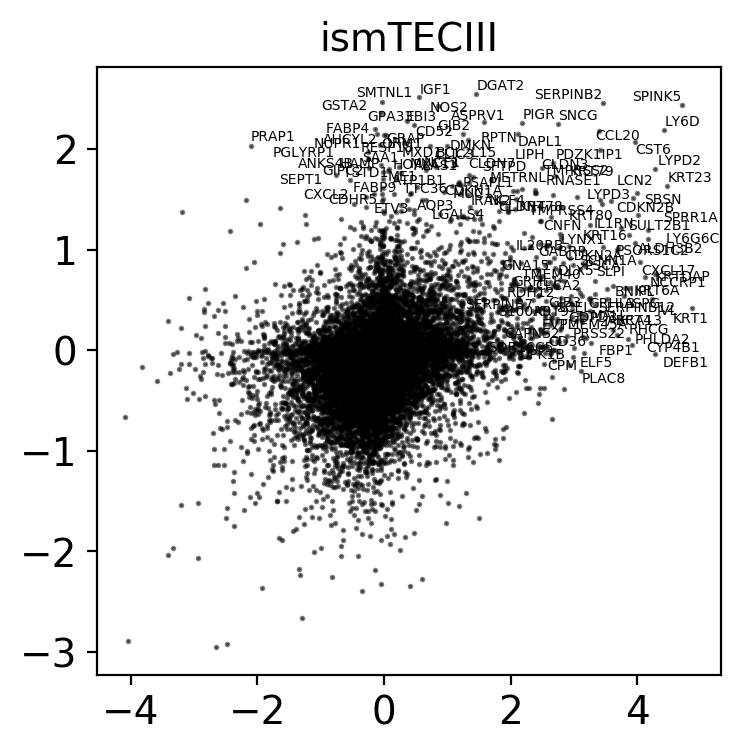

02_Output/HTA08.v01.A04.FigS1_epi_ismyo.pdf


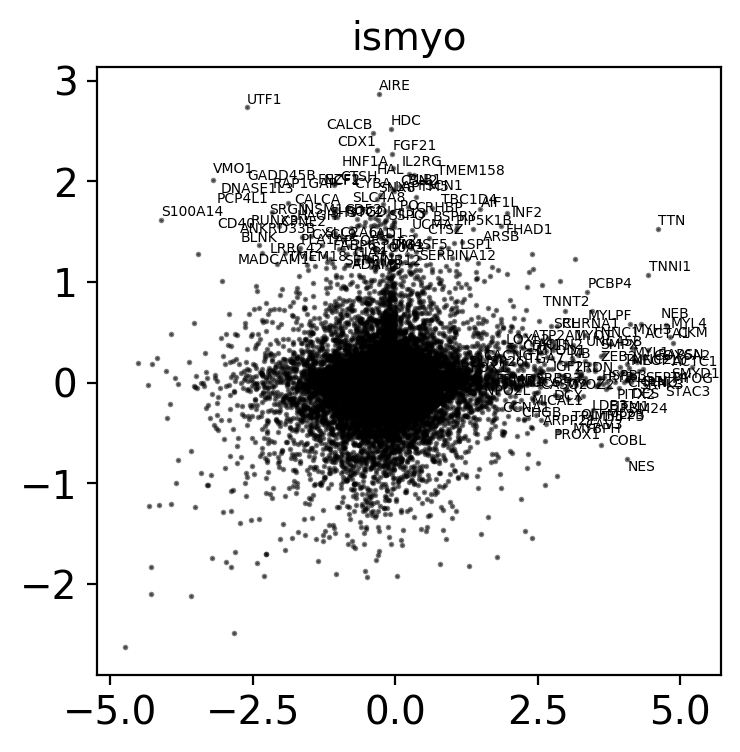

In [150]:
for ct in fc_tec.keys():
    species.draw_scatter_speices_ct(ct,fc_tec,version,fig_folder,adjust_lim=3)
    plt.show()

In [102]:
mk = markers.marker(TEC_hs,'anno_final_v5')

/mnt/thymus_atlas/scjp/markers.py:180: RuntimeWarning:

invalid value encountered in true_divide



In [ ]:
lr_epi = model.transfer_annotation_jp(TEC_hs,'anno_final_v4',TEC_hs,'anno_pred')

In [954]:
def show_marker_from_lr(lr,ct,genelist):

    c = lr_epi.classes_==ct
    return genelist[np.argsort(-lr_epi.coef_[c])]

In [961]:
print(show_marker_from_lr(lr_epi,'TEC(neuro)',TEC_hs.raw.var_names))

Index([['PCSK1N', 'NNAT', 'BEX1', 'STMN1', 'CIB2', 'TUBA1A', 'HES6', 'GHRH', 'CLDN3', 'WFDC2', 'SCG5', 'DAPL1', 'STK33', 'MYO6', 'KIF19', 'SYNE2', 'ASCL1', 'TESC', 'C4orf48', 'MAP1B', 'CPE', 'TCEAL7', 'NGFRAP1', 'CAMK2B', 'NTHL1', 'CLDN4', 'OVOS2', 'BEX2', 'FAM213A', 'FAM60A', 'SCCPDH', 'PGM2L1', 'SH3BGRL3', 'HEY1', 'CRIP2', 'AGPAT2', 'CMIP', 'MARCKSL1', 'KIF1A', 'MB', 'GNG8', 'HES4', 'FXYD6', 'FAM107A', 'SSR4', 'HES1', 'GPX2', 'TMEM59', 'PEG10', 'P4HTM', 'SOX4', 'CETN2', 'AES', 'CLDN9', 'ENO2', 'EID1', 'SCG3', 'PCBP4', 'TACC2', 'SPOCK1', 'LURAP1L', 'TTC3', 'PGF', 'TBCB', 'NPDC1', 'NHLH1', 'CD24', 'KLHL35', 'NLRP1', 'RGS17', 'C21orf59', 'MAPT', 'OLFM1', 'UBE2E3', 'CA8', 'CAPSL', 'TCF4', 'C2orf40', 'MMP24-AS1', 'SCAND1', 'HSPA2', 'SMARCE1', 'RAB3B', 'NELL1', 'CHMP2A', 'ZNF750', 'ATP6V1G1', 'TIA1', 'NEURL1', 'CNOT7', 'SNAP25', 'PCLO', 'SAMHD1', 'MAP2', 'RERE', 'PODXL2', 'NGB', 'TUBB4B', 'CHGB', 'KCNH2', ...]], dtype='object', name='index')


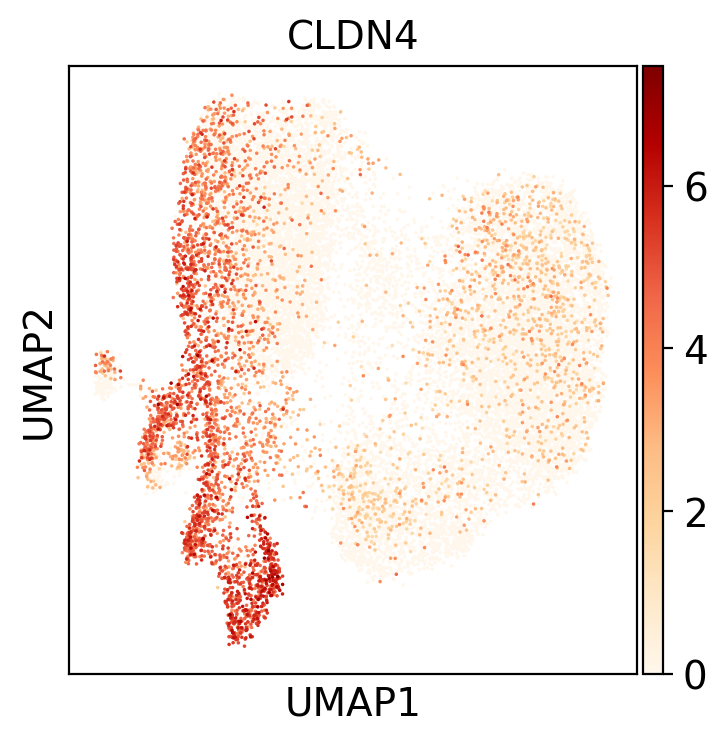

In [971]:
scjp.us(TEC_hs,'CLDN4')

## mature T cells

In [525]:
humanised_names = [scjp.species.mouse_to_human(x) for x in mm_jp.raw.var_names]

In [526]:
mm_h = sc.AnnData(mm_jp.raw.X,var=mm_jp.raw.var,obs=mm_jp.obs)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [527]:
mm_h.var_names = humanised_names

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [528]:
mm_h.raw = mm_h

In [529]:
mm_c, hs_c = model.get_common_var_raw(mm_h,hs)

calculating a...
calculating b...


In [530]:
mm_select = ['DN(P)',
 'DN(Q)',
 'DP(P)',
 'DP(Q)','NK',
 'NKT','T_CD4',
 'T_CD8',
 'T_Tnfrsf9',
 'T_gd',
 'Treg','entry1',
 'entry2']

mm_select_mature = [
 'NK',
 'NKT','T_CD4',
 'T_CD8',
 'T_Tnfrsf9',
 'T_gd',
 'Treg','entry1',
 'entry2']

In [531]:
mm_T = mm_c[mm_c.obs['anno_level_15'].isin(mm_select_mature)]

In [532]:
hs_select = [
 'CD4+T',
 'CD8+T',
 'CD8αα(I)',
 'CD8αα(II)',
 'DN(P)',
 'DN(Q)',
 'DN(early)',
 'DP(P)',
 'DP(Q)','Th17',
 'Treg','T(agonist)',
 'Treg(diff)', 'αβT(entry)',
 'γδT', 'ILC3','NK',
 'NKT']

hs_select_mature = [
 'CD4+T',
 'CD8+T',
 'CD8αα(I)',
 'CD8αα(II)',
 'Treg','T(agonist)',
 'Treg(diff)', 'αβT(entry)',
 'γδT', 'NK',
 'NKT']

In [533]:
c1 = hs_c.obs['anno_final_v1'].isin(hs_select_mature)
c2 = hs_c.obs['Stage'].isin('F4,P1'.split(','))

hs_T = hs_c[c1&c2]

In [534]:
hs_T.obs['anno_merge'] = [x+'_hs' for x in hs_T.obs['anno_final_v1']]
mm_T.obs['anno_merge'] = [x+'_mm' for x in mm_T.obs['anno_level_15']]

Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.obs` of view, making a copy.


In [535]:
ad = {}
ad['hs'] = hs_T
ad['mm'] = mm_T

In [536]:
T = scjp.merge_matrix(ad)

25005
Sample
n_counts
n_genes
donor
organ
sort
method
file
mito
doublet_scores
predicted_doublets
name
source
birth
batch
bbk
Donor
Order
Age
Gender
Source
Stage
Stage2
Cycle_score
isCycle
scrublet_doublets
is_Fig1
is_file_Fig1
true_doublets
missed_doublets_scbl
missed_doublets_jp
anno_doublet_4_scores
anno_doublet_5_scores
anno_doublet_6_scores
anno_doublet_7_scores
anno_doublet_8_scores
anno_doublet_T_scores
dbl_jp_method
broad_doublets
anno_pred
anno_fig1_detailed.replaced.1
anno_fig1_detailed
anno_predict_B
anno_predict_fig1.replaced.1
anno_predict_fig1
anno_final_v1
anno_final_v2_epi
Anno_level_1
Anno_level_2
Anno_level_3
Anno_level_4
Anno_level_5
Anno_level_fig1
Anno_level_Staal
donor_method
factor
anno_final_v3
anno_final_v4
anno_final_v5
anno_merge
leiden
anno_level_1
anno_level_2
anno_level_4
anno_level_5
anno_level_15


## mouse to human

creating lr model...


/home/ubuntu/.local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

/home/ubuntu/.local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning:

Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.



making lr prediction...


Trying to set attribute `.obs` of view, making a copy.


updating lr to adata...


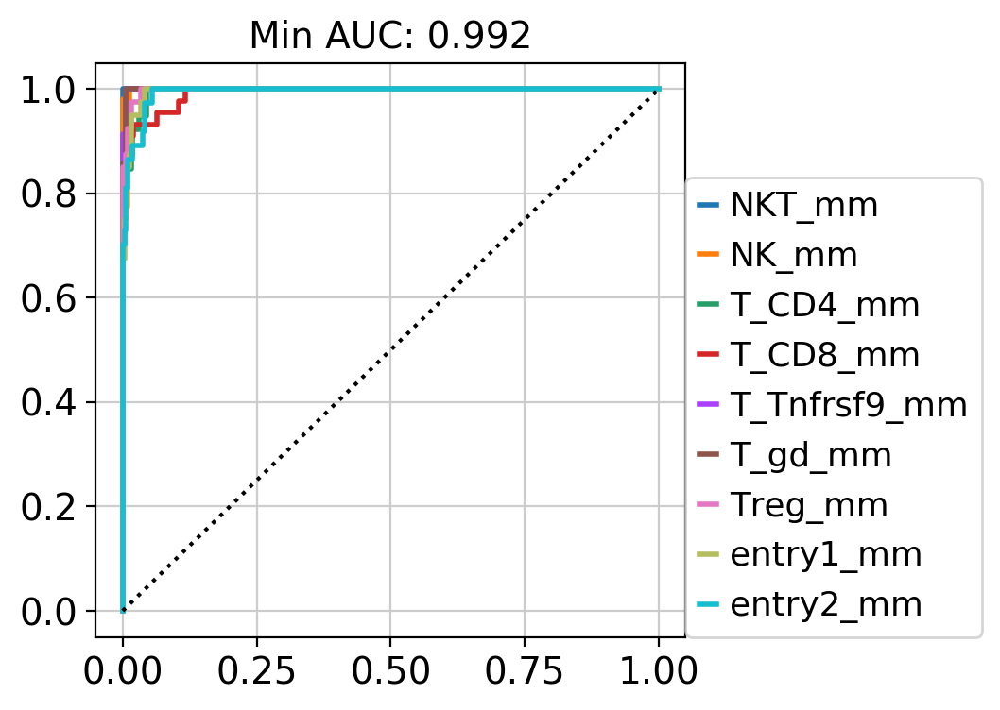

In [111]:
lr_mouse = model.transfer_annotation_jp(T[T.obs['name']=='mm'],'anno_merge',
                                       T[T.obs['name']=='hs'],'anno_pred_mm',raw=False)

In [112]:
proba_MtH = lr_mouse.predict_proba(T.X)

In [113]:
a = proba_MtH[T.obs['anno_merge']=='CD8+T_hs'].mean(axis=0)
b = lr_mouse.classes_

sorted([(b1,a1) for a1,b1 in zip(a,b)],key=lambda x:-x[1])

[('T_CD4_mm', 0.28291750960003975),
 ('T_CD8_mm', 0.2110056137860177),
 ('T_Tnfrsf9_mm', 0.19162241854124545),
 ('Treg_mm', 0.1676423707951905),
 ('NKT_mm', 0.12171459035159972),
 ('T_gd_mm', 0.017277597417094122),
 ('entry1_mm', 0.005655264739302643),
 ('NK_mm', 0.0015343792411013427),
 ('entry2_mm', 0.0006302555284075877)]

## human to mouse

creating lr model...
making lr prediction...
updating lr to adata...


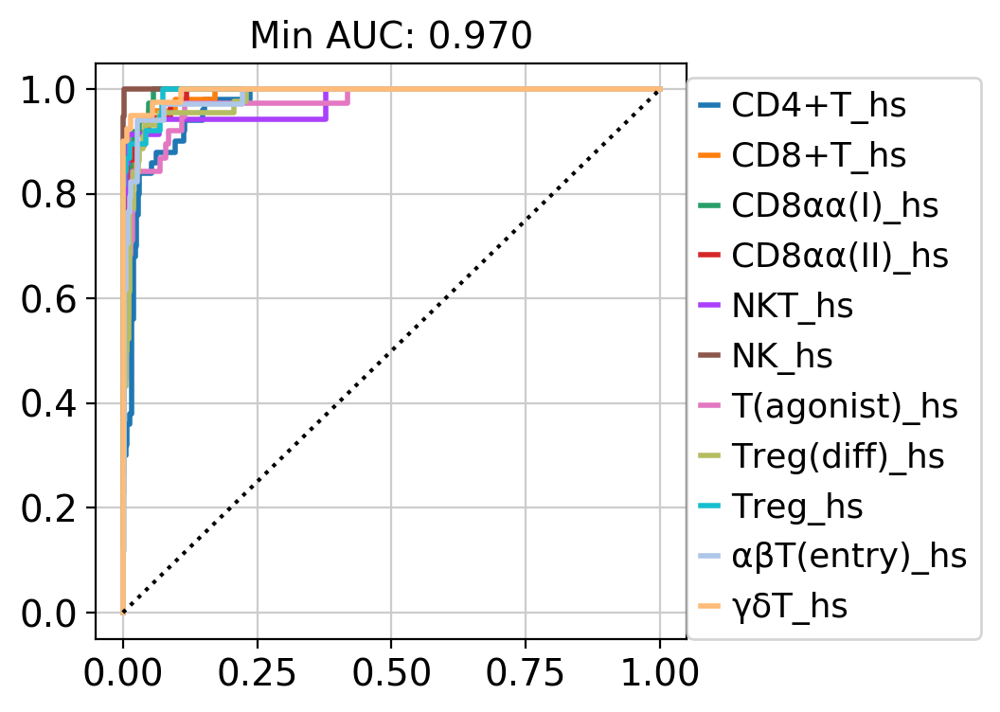

In [114]:
c1 = T.obs['name']=='hs'
lr_human = model.transfer_annotation_jp(T[c1],'anno_merge',
                                       T,'anno_pred_hs',
                                        raw=False)

In [115]:
proba_HtM = lr_human.predict_proba(T.X)

In [116]:
a = proba_HtM[T.obs['anno_merge']=='T_CD8_mm'].mean(axis=0)
b = lr_human.classes_

sorted([(b1,a1) for a1,b1 in zip(a,b)],key=lambda x:-x[1])

[('γδT_hs', 0.1822520875869589),
 ('αβT(entry)_hs', 0.17864799308753257),
 ('T(agonist)_hs', 0.16278507372892026),
 ('CD8αα(I)_hs', 0.10661154974583081),
 ('CD8+T_hs', 0.08437120328895029),
 ('CD4+T_hs', 0.07736389610734146),
 ('CD8αα(II)_hs', 0.07221997318586099),
 ('Treg(diff)_hs', 0.05428995765539317),
 ('Treg_hs', 0.046328829039546965),
 ('NKT_hs', 0.023637640961986794),
 ('NK_hs', 0.011491795611677754)]

In [117]:
HtM_mean_proba =[]
for mm_label in lr_mouse.classes_:
    HtM_mean_proba.append(proba_HtM[T.obs['anno_merge']==mm_label].mean(axis=0))
HtM_mean_proba = np.vstack(HtM_mean_proba)  

In [118]:
MtH_mean_proba =[]
for hs_label in lr_human.classes_:
    MtH_mean_proba.append(proba_MtH[T.obs['anno_merge']==hs_label].mean(axis=0))
MtH_mean_proba = np.vstack(MtH_mean_proba)      

In [119]:
HtM_mean_proba.shape

(9, 11)

In [120]:
MtH_mean_proba.shape

(11, 9)

In [121]:
lr_mouse.classes_

array(['NKT_mm', 'NK_mm', 'T_CD4_mm', 'T_CD8_mm', 'T_Tnfrsf9_mm',
       'T_gd_mm', 'Treg_mm', 'entry1_mm', 'entry2_mm'], dtype=object)

In [122]:
hs_order = [ 
            'αβT(entry)_hs','CD4+T_hs', 'CD8+T_hs','Treg(diff)_hs', 'Treg_hs','T(agonist)_hs',
             'CD8αα(I)_hs', 'CD8αα(II)_hs','γδT_hs','NKT_hs', 'NK_hs'

]
hs_index = [list(lr_human.classes_).index(x) for x in hs_order]

mm_order = [ 
            'entry1_mm', 'entry2_mm', 'T_CD4_mm', 'T_CD8_mm','Treg_mm',
            'T_Tnfrsf9_mm','T_gd_mm', 'NKT_mm',  'NK_mm'
           ]
mm_index = [list(lr_mouse.classes_).index(x) for x in mm_order]

02_Output/HTA08.v01.A04.FigS1_matureT_mouse_comp_HtM.pdf


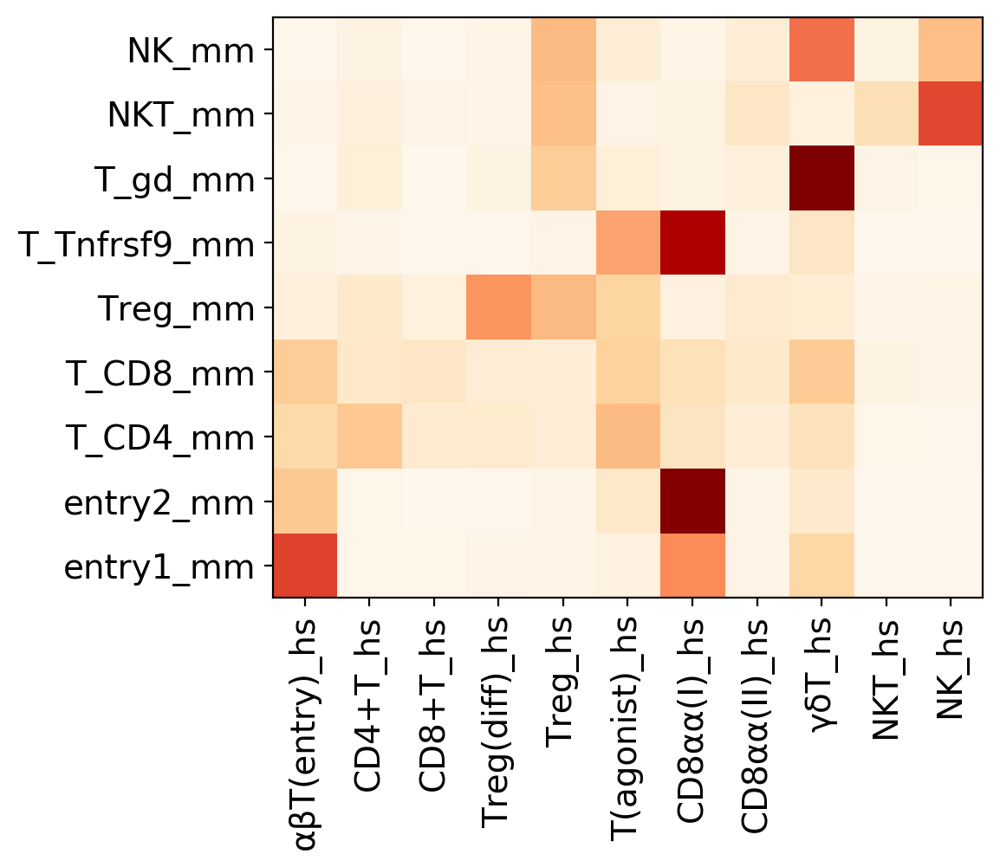

In [125]:
fig, ax = plt.subplots(figsize=(6,6))
im = ax.imshow(HtM_mean_proba[mm_index][:,hs_index])
plt.grid(False)

xlabel = lr_human.classes_[hs_index]
ylabel = lr_mouse.classes_[mm_index]

ax.set_xticks(np.arange(len(xlabel)))
ax.set_yticks(np.arange(len(ylabel)+1))

plt.ylim(-0.5,len(ylabel)-0.5)

ax.set_xticklabels(xlabel)
ax.set_yticklabels(ylabel)

plt.setp(ax.get_xticklabels(),rotation=90)

fig.tight_layout()
plt.grid(False)
scjp.jp_save_fig(version,'FigS1_matureT_mouse_comp_HtM',fig_folder=fig_folder)

02_Output/HTA08.v01.A04.FigS1_matureT_mouse_comp_MtH.pdf


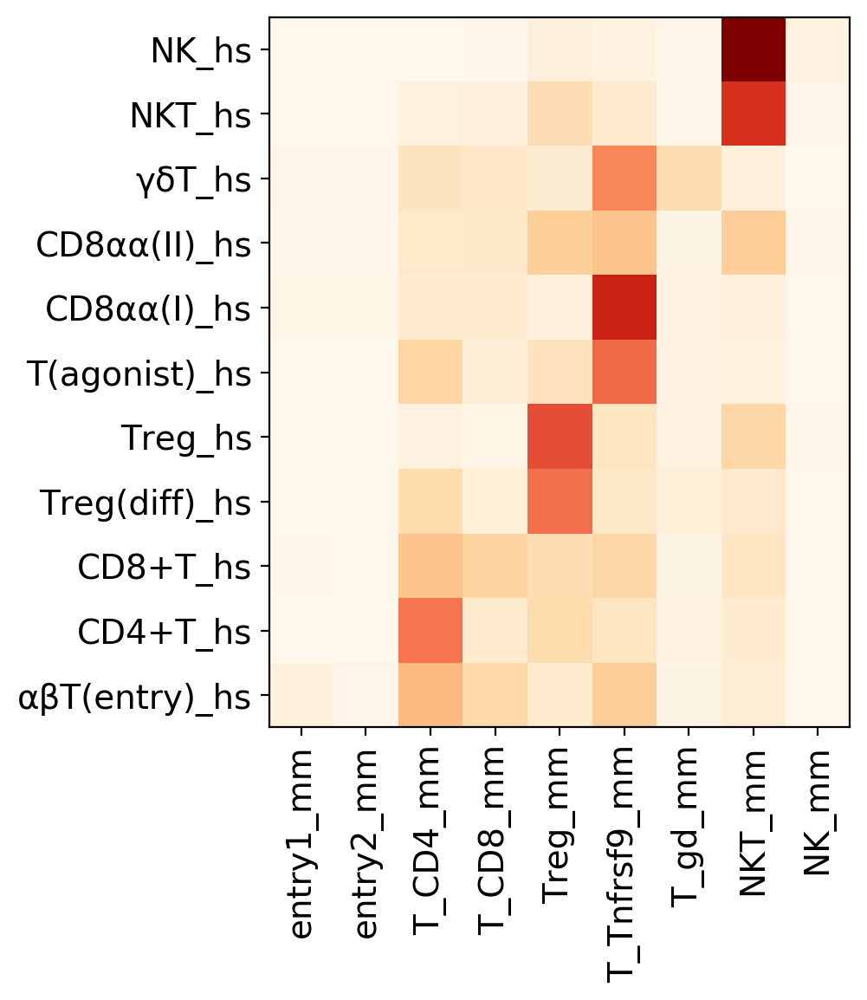

In [126]:
fig, ax = plt.subplots(figsize=(6,6))
im = ax.imshow(MtH_mean_proba[hs_index][:,mm_index])
plt.grid(False)

xlabel = lr_mouse.classes_[mm_index]
ylabel = lr_human.classes_[hs_index]

ax.set_xticks(np.arange(len(xlabel)))
ax.set_yticks(np.arange(len(ylabel)+1))

plt.ylim(-0.5,len(ylabel)-0.5)

ax.set_xticklabels(xlabel)
ax.set_yticklabels(ylabel)

plt.setp(ax.get_xticklabels(),rotation=90)

fig.tight_layout()
plt.grid(False)
scjp.jp_save_fig(version,'FigS1_matureT_mouse_comp_MtH',fig_folder=fig_folder)

In [127]:
multi = MtH_mean_proba[hs_index][:,mm_index]*HtM_mean_proba[mm_index][:,hs_index].T

02_Output/HTA08.v01.A04.FigS1_matureT_mouse_combi.pdf


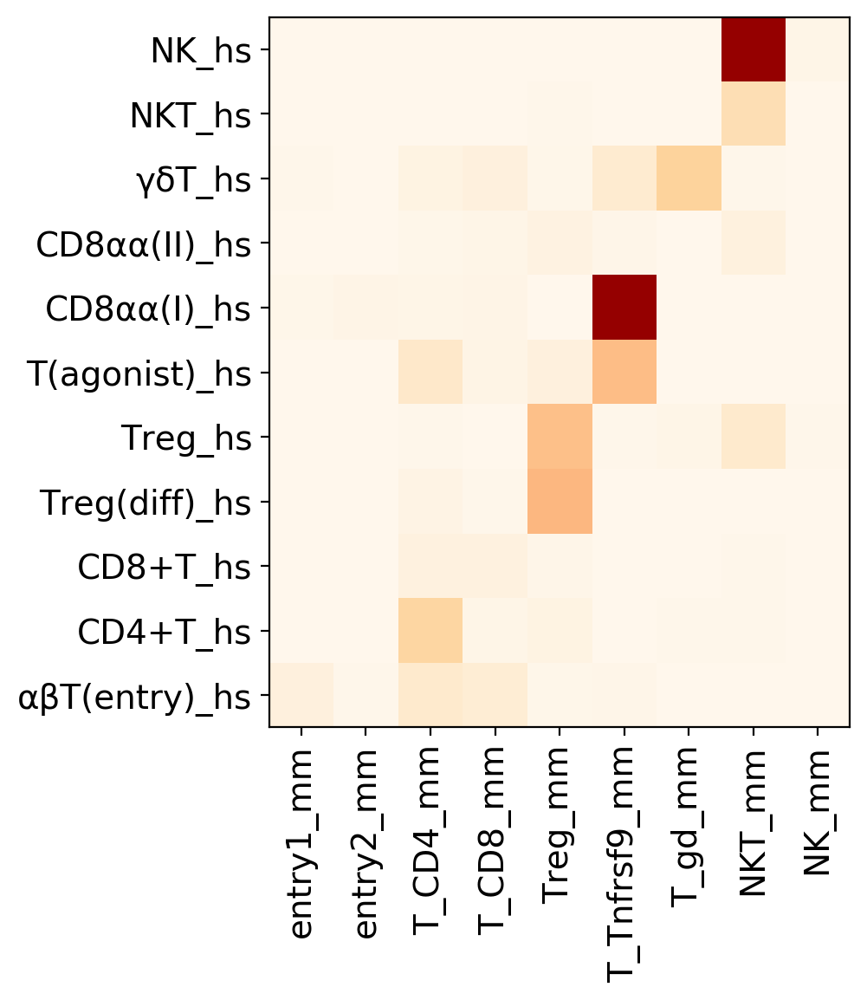

In [128]:
fig, ax = plt.subplots(figsize=(6,6))
im = ax.imshow(multi,vmax=0.4)
plt.grid(False)

xlabel = lr_mouse.classes_[mm_index]
ylabel = lr_human.classes_[hs_index]

ax.set_xticks(np.arange(len(xlabel)))
ax.set_yticks(np.arange(len(ylabel)+1))

plt.ylim(-0.5,len(ylabel)-0.5)

ax.set_xticklabels(xlabel)
ax.set_yticklabels(ylabel)

plt.setp(ax.get_xticklabels(),rotation=90)

fig.tight_layout()
plt.grid(False)
scjp.jp_save_fig(version,'FigS1_matureT_mouse_combi',fig_folder=fig_folder)

In [537]:
T.obs['isTnfrsf9'] = T.obs['anno_merge'].isin('T_Tnfrsf9_mm,CD8αα(I)_hs'.split(','))
T.obs['isCD8'] = T.obs['anno_merge'].isin('CD8+T_hs,T_CD8_mm'.split(','))
T.obs['isCD4'] = T.obs['anno_merge'].isin('CD4+T_hs,T_CD4_mm'.split(','))
T.obs['isTreg'] = T.obs['anno_merge'].isin('Treg_hs,Treg(diff)_hs,Treg_mm'.split(','))
T.obs['isTgd'] = T.obs['anno_merge'].isin('γδT_hs,T_gd_mm'.split(','))
T.obs['isNKT'] = T.obs['anno_merge'].isin('NKT_hs,NKT_mm'.split(','))
T.obs['isNK'] = T.obs['anno_merge'].isin('NK_hs,NK_mm'.split(','))
T.obs['isNK_NKT'] = T.obs['anno_merge'].isin('NK_hs,NKT_mm'.split(','))
T.obs['isCD8aaII'] = T.obs['anno_merge'].isin('CD8αα(II)_hs,NKT_mm'.split(','))

In [538]:
T_hs = T[T.obs['name']=='hs']
T_hs.raw = T_hs

In [539]:
T_mm = T[T.obs['name']=='mm']
T_mm.raw = T_mm

In [540]:
T.raw = T

In [132]:
#fc = defaultdict(lambda : defaultdict())

In [469]:
for ct in ['isNKT','isTnfrsf9','isCD8aaII']: #'isCD8','isCD4','isTreg','isTgd','isNKT','isNK','isNK_NKT',
    print(ct)
    fc[ct]['hs'] = markers.volcano_plot(T_hs,ct,True,False)
    fc[ct]['mm'] = markers.volcano_plot(T_mm,ct,True,False)

isNKT
isTnfrsf9
isCD8aaII


In [541]:
fc2 = defaultdict(lambda : defaultdict())

In [545]:
ct = 'isTnfrsf9'

subset = T[T.obs[ct]].copy()

In [547]:
subset.raw = subset

In [548]:
fc2[ct]['h_m'] = markers.volcano_plot(subset,'name','hs','mm')

In [549]:
fc2[ct]['mks'] =markers.volcano_plot(T,'isTnfrsf9',True,False)

/mnt/thymus_atlas/scjp/species.py:66: RuntimeWarning:

divide by zero encountered in log10

/mnt/thymus_atlas/scjp/species.py:67: RuntimeWarning:

divide by zero encountered in log10



02_Output/HTA08.v01.A04.FigS1_species_v2_isTnfrsf9.pdf


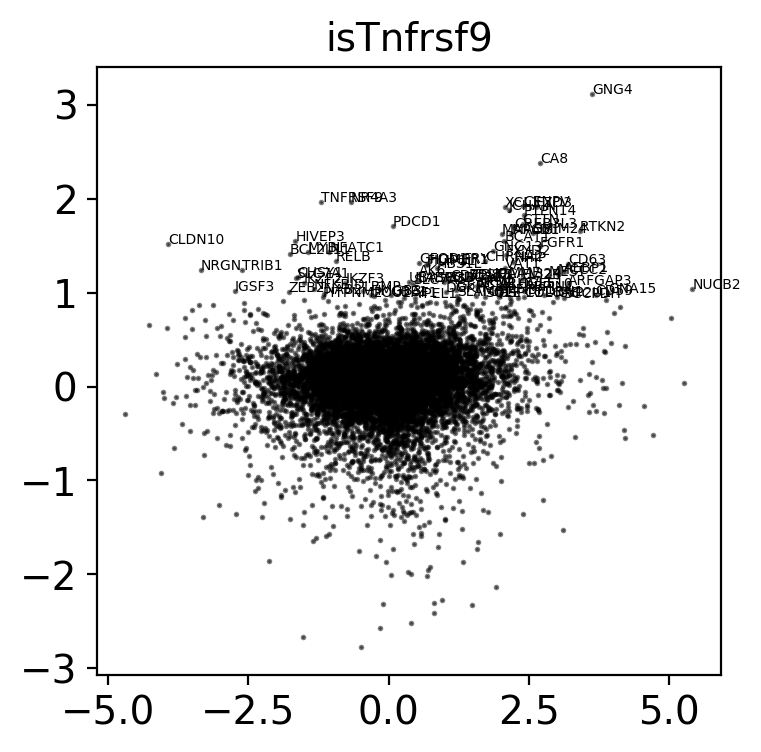

In [557]:
scjp.species.draw_scatter_speices_ct_v2(ct,fc2,version,fig_folder,adjust_lim = None)

02_Output/HTA08.v01.A04.FigS1_epi_isCD8aaII.pdf


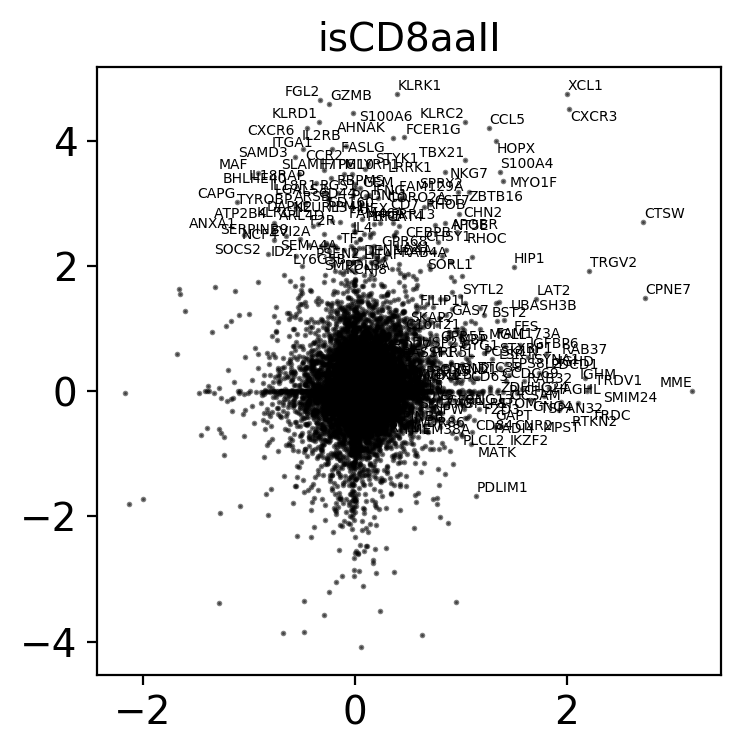

02_Output/HTA08.v01.A04.FigS1_epi_isTnfrsf9.pdf


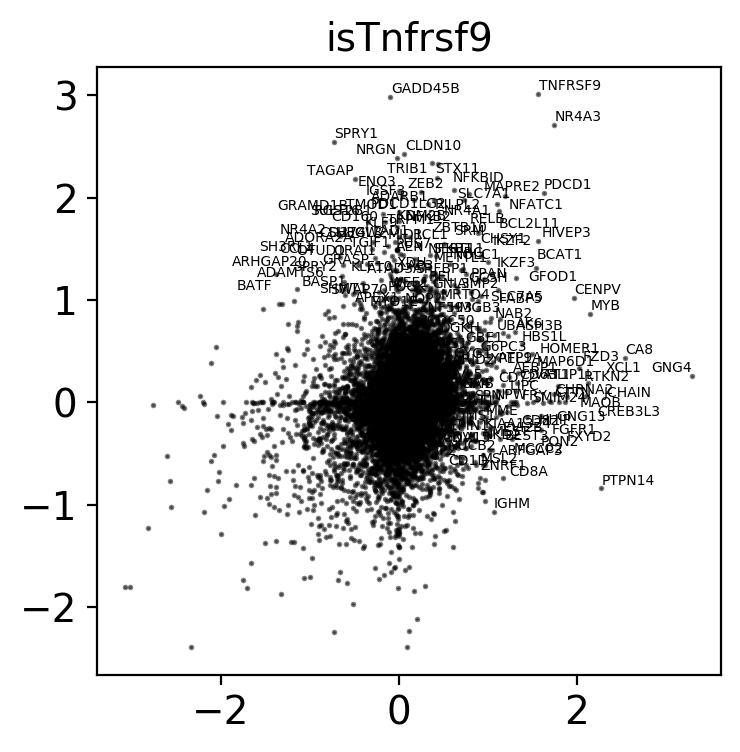

02_Output/HTA08.v01.A04.FigS1_epi_isNKT.pdf


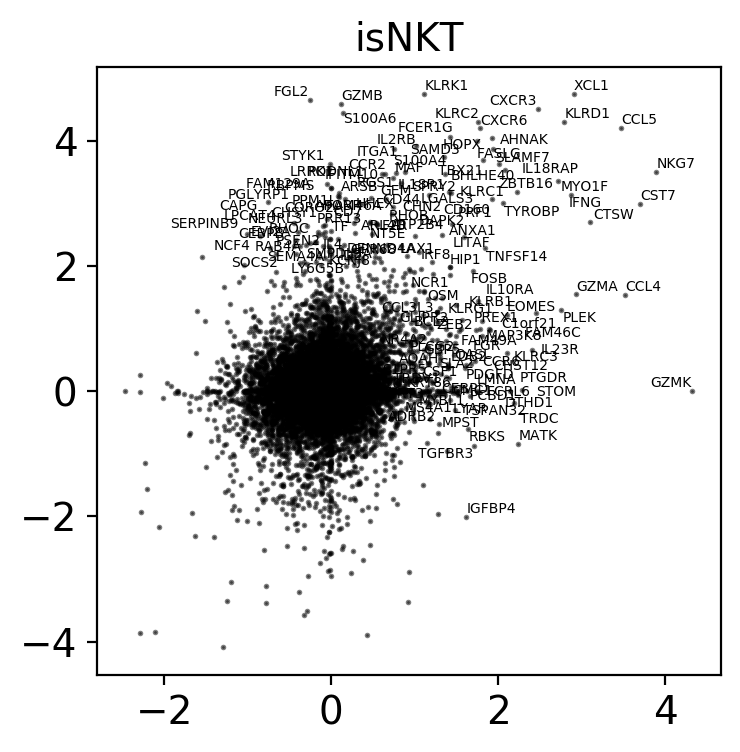

In [470]:
for ct in ['isCD8aaII','isTnfrsf9','isNKT']:
    draw_scatter_speices_ct(ct,fc)
    plt.show()

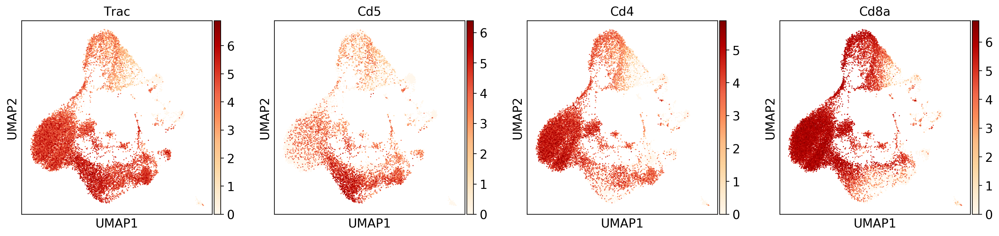

In [508]:
scjp.us(mm_jp,'Trac,Cd5,Cd4,Cd8a')

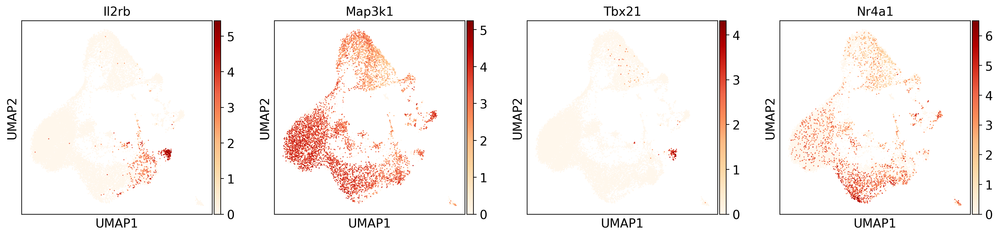

In [511]:
scjp.us(mm_jp,'Il2rb,Map3k1,Tbx21')

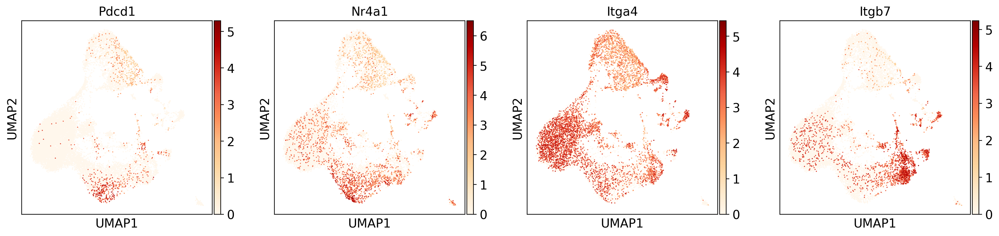

In [515]:
scjp.us(mm_jp,'Pdcd1,Nr4a1,Itga4,Itgb7')

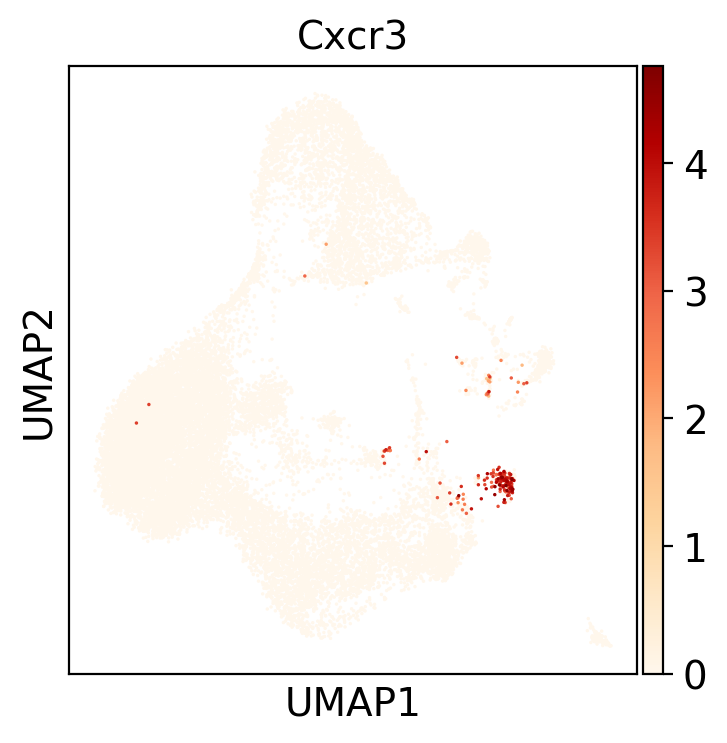

In [516]:
scjp.us(mm_jp,'Cxcr3')

## DNDP T cells

In [166]:
mm_select = ['HSC','DN(P)',
 'DN(Q)',
 'DP(P)',
 'DP(Q)','entry1',
 'entry2']

In [167]:
mm_T = mm_c[mm_c.obs['anno_level_14'].isin(mm_select)]

In [168]:
hs_select = ['ETP',
 'DN(P)',
 'DN(Q)',
 'DN(early)',
 'DP(P)',
 'DP(Q)', 'αβT(entry)']



In [169]:
c1 = hs_c.obs['anno_final_v1'].isin(hs_select)
c2 = hs_c.obs['Stage'].isin('F4,P1'.split(','))

hs_T = hs_c[c1&c2]

In [170]:
hs_T.obs['anno_merge'] = [x+'_hs' for x in hs_T.obs['anno_final_v1']]
mm_T.obs['anno_merge'] = [x+'_mm' for x in mm_T.obs['anno_level_14']]

Trying to set attribute `.obs` of view, making a copy.
Trying to set attribute `.obs` of view, making a copy.


In [171]:
ad = {}
ad['hs'] = hs_T
ad['mm'] = mm_T

In [172]:
T = scjp.merge_matrix(ad)

66142
Sample
n_counts
n_genes
donor
organ
sort
method
file
mito
doublet_scores
predicted_doublets
name
source
birth
batch
bbk
Donor
Order
Age
Gender
Source
Stage
Stage2
Cycle_score
isCycle
scrublet_doublets
is_Fig1
is_file_Fig1
true_doublets
missed_doublets_scbl
missed_doublets_jp
anno_doublet_4_scores
anno_doublet_5_scores
anno_doublet_6_scores
anno_doublet_7_scores
anno_doublet_8_scores
anno_doublet_T_scores
dbl_jp_method
broad_doublets
anno_pred
anno_fig1_detailed.replaced.1
anno_fig1_detailed
anno_predict_B
anno_predict_fig1.replaced.1
anno_predict_fig1
anno_final_v1
anno_final_v2_epi
Anno_level_1
Anno_level_2
Anno_level_3
Anno_level_4
Anno_level_5
Anno_level_fig1
Anno_level_Staal
donor_method
factor
anno_final_v3
anno_final_v4
anno_final_v5
anno_merge
leiden
anno_level_1
anno_level_2
anno_level_4
anno_level_5
anno_level_6
age
anno_level_7
anno_level_8
anno_level_9
trac.replaced.1
trac.replaced.2
trdc.replaced.1
trdc.replaced.2
trac.replaced.3
trac.replaced.4
trdc.replaced.3
trdc.r

## mouse to human

creating lr model...
making lr prediction...


Trying to set attribute `.obs` of view, making a copy.


updating lr to adata...


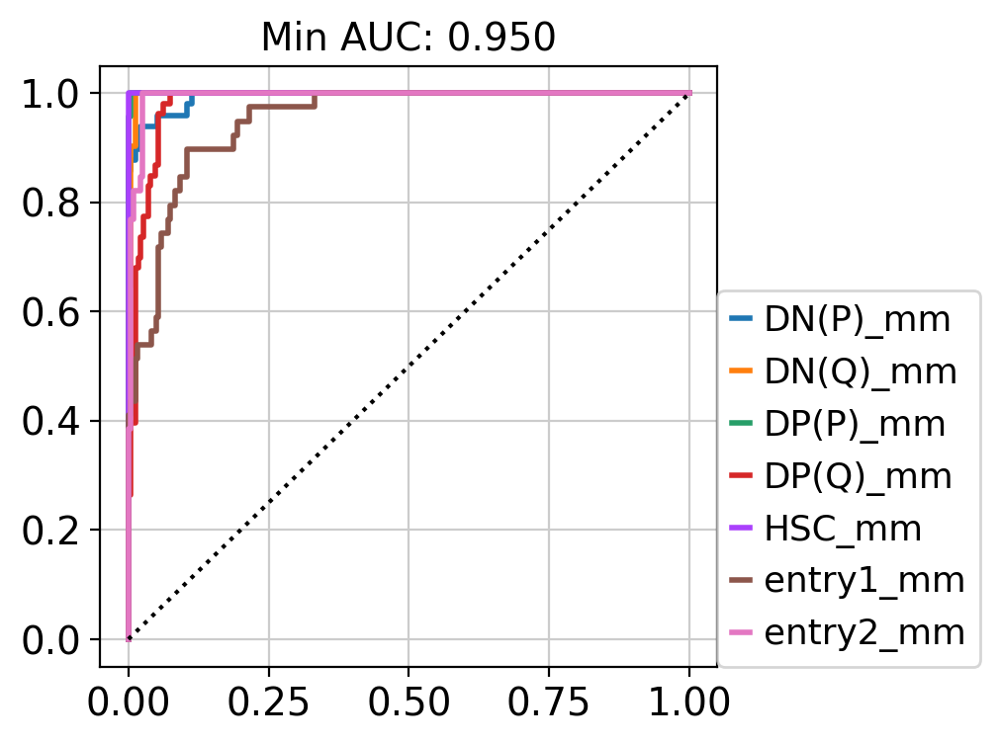

In [173]:
lr_mouse = model.transfer_annotation_jp(T[T.obs['name']=='mm'],'anno_merge',
                                       T[T.obs['name']=='hs'],'anno_pred_mm',raw=False)

In [174]:
proba_MtH = lr_mouse.predict_proba(T.X)

In [175]:
a = proba_MtH[T.obs['anno_merge']=='DN(P)_hs'].mean(axis=0)
b = lr_mouse.classes_

sorted([(b1,a1) for a1,b1 in zip(a,b)],key=lambda x:-x[1])

[('DP(P)_mm', 0.5235847386169167),
 ('entry2_mm', 0.3166050433473789),
 ('DN(Q)_mm', 0.08731345252204627),
 ('DN(P)_mm', 0.05275320640656061),
 ('HSC_mm', 0.013754667557453214),
 ('DP(Q)_mm', 0.005606770390152948),
 ('entry1_mm', 0.00038212115949289423)]

## human to mouse

creating lr model...
making lr prediction...
updating lr to adata...


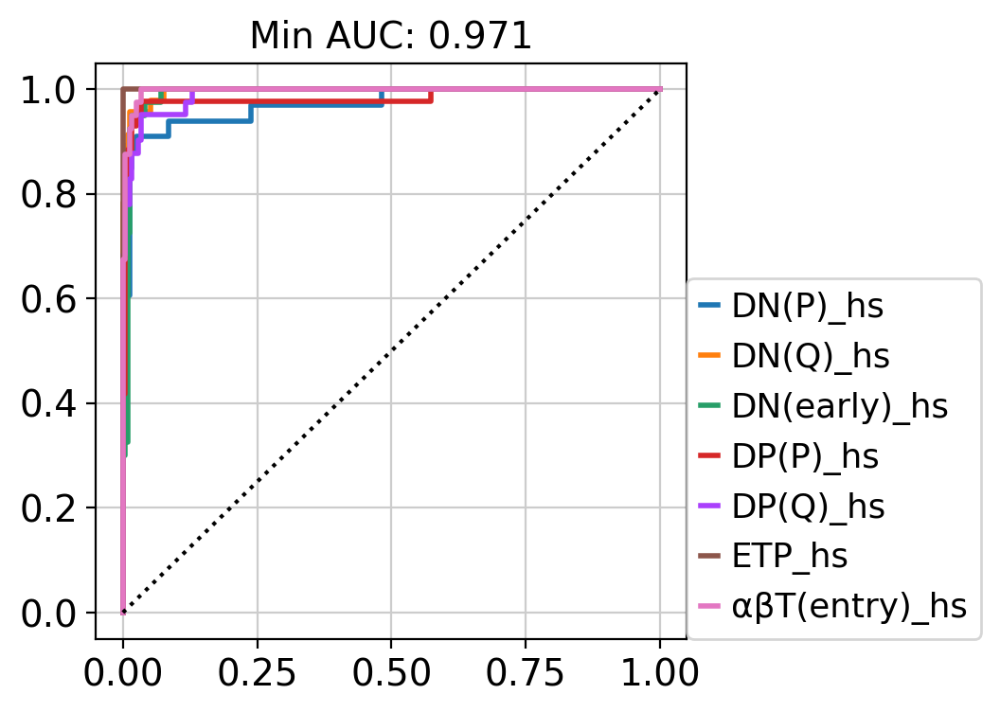

In [176]:
c1 = T.obs['name']=='hs'
lr_human = model.transfer_annotation_jp(T[c1],'anno_merge',
                                       T,'anno_pred_hs',
                                        raw=False)

In [177]:
proba_HtM = lr_human.predict_proba(T.X)

In [178]:
a = proba_HtM[T.obs['anno_merge']=='DN(P)_mm'].mean(axis=0)
b = lr_human.classes_

sorted([(b1,a1) for a1,b1 in zip(a,b)],key=lambda x:-x[1])

[('DP(P)_hs', 0.5615644481746264),
 ('DN(P)_hs', 0.25112738217890485),
 ('DN(early)_hs', 0.16853634972437634),
 ('ETP_hs', 0.016563972595898882),
 ('αβT(entry)_hs', 0.0018979869412939093),
 ('DN(Q)_hs', 0.0002888744381008245),
 ('DP(Q)_hs', 2.0985946799787863e-05)]

In [179]:
HtM_mean_proba =[]
for mm_label in lr_mouse.classes_:
    HtM_mean_proba.append(proba_HtM[T.obs['anno_merge']==mm_label].mean(axis=0))
HtM_mean_proba = np.vstack(HtM_mean_proba)  

In [180]:
MtH_mean_proba =[]
for hs_label in lr_human.classes_:
    MtH_mean_proba.append(proba_MtH[T.obs['anno_merge']==hs_label].mean(axis=0))
MtH_mean_proba = np.vstack(MtH_mean_proba)      

In [181]:
HtM_mean_proba.shape

(7, 7)

In [182]:
MtH_mean_proba.shape

(7, 7)

In [184]:
lr_human.classes_

array(['DN(P)_hs', 'DN(Q)_hs', 'DN(early)_hs', 'DP(P)_hs', 'DP(Q)_hs',
       'ETP_hs', 'αβT(entry)_hs'], dtype=object)

In [183]:
lr_mouse.classes_

array(['DN(P)_mm', 'DN(Q)_mm', 'DP(P)_mm', 'DP(Q)_mm', 'HSC_mm',
       'entry1_mm', 'entry2_mm'], dtype=object)

In [186]:
hs_order = ['ETP_hs','DN(early)_hs','DN(P)_hs', 'DN(Q)_hs',
            'DP(P)_hs', 'DP(Q)_hs', 
            'αβT(entry)_hs'

]
hs_index = [list(lr_human.classes_).index(x) for x in hs_order]

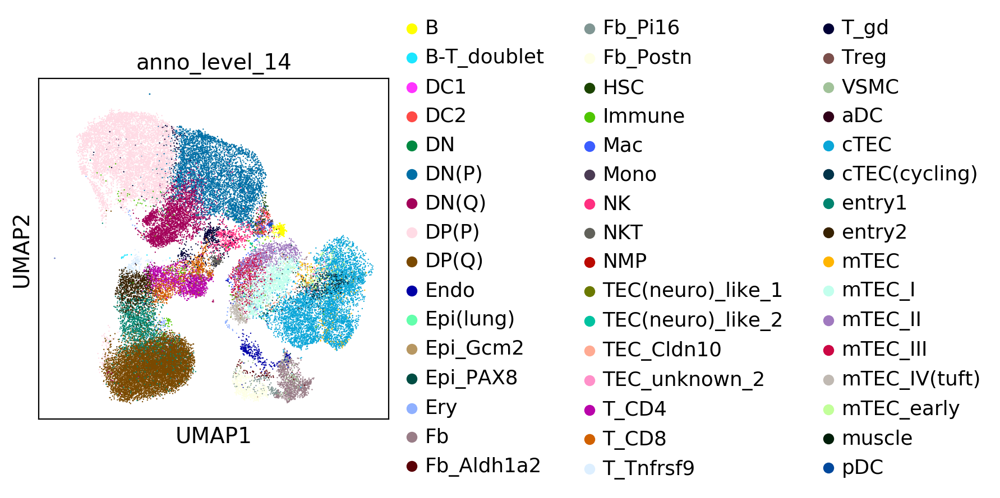

In [187]:
scjp.us(mm,'anno_level_14')

In [188]:
mm_order = ['HSC_mm','DN(P)_mm', 'DN(Q)_mm', 'DP(P)_mm', 'DP(Q)_mm',
            'entry1_mm', 'entry2_mm', 
           ]
mm_index = [list(lr_mouse.classes_).index(x) for x in mm_order]

02_Output/HTA08.v01.A04.FigS1_developT_mouse_comp_HtM.pdf


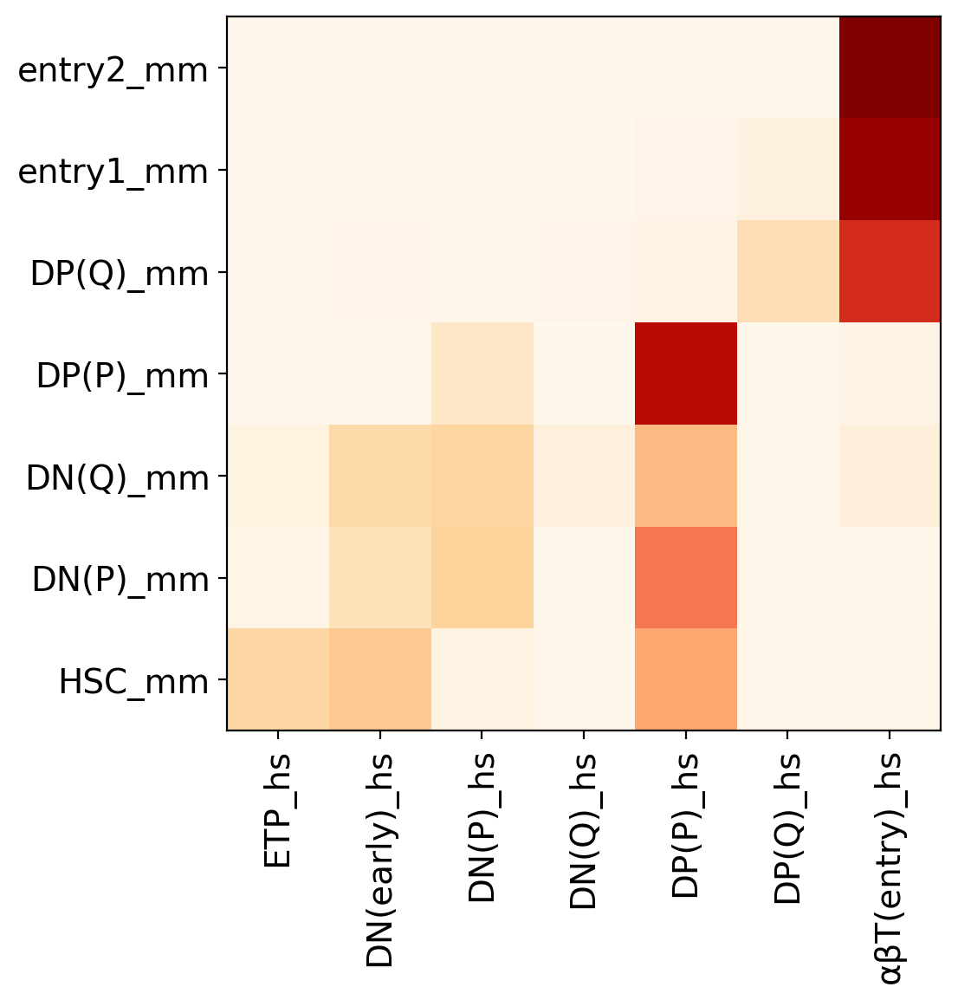

In [189]:
fig, ax = plt.subplots(figsize=(6,6))
im = ax.imshow(HtM_mean_proba[mm_index][:,hs_index])
plt.grid(False)

xlabel = lr_human.classes_[hs_index]
ylabel = lr_mouse.classes_[mm_index]

ax.set_xticks(np.arange(len(xlabel)))
ax.set_yticks(np.arange(len(ylabel)+1))

plt.ylim(-0.5,len(ylabel)-0.5)

ax.set_xticklabels(xlabel)
ax.set_yticklabels(ylabel)

plt.setp(ax.get_xticklabels(),rotation=90)

fig.tight_layout()
plt.grid(False)
scjp.jp_save_fig(version,'FigS1_developT_mouse_comp_HtM',fig_folder=fig_folder)

02_Output/HTA08.v01.A04.FigS1_developT_mouse_comp_MtH.pdf


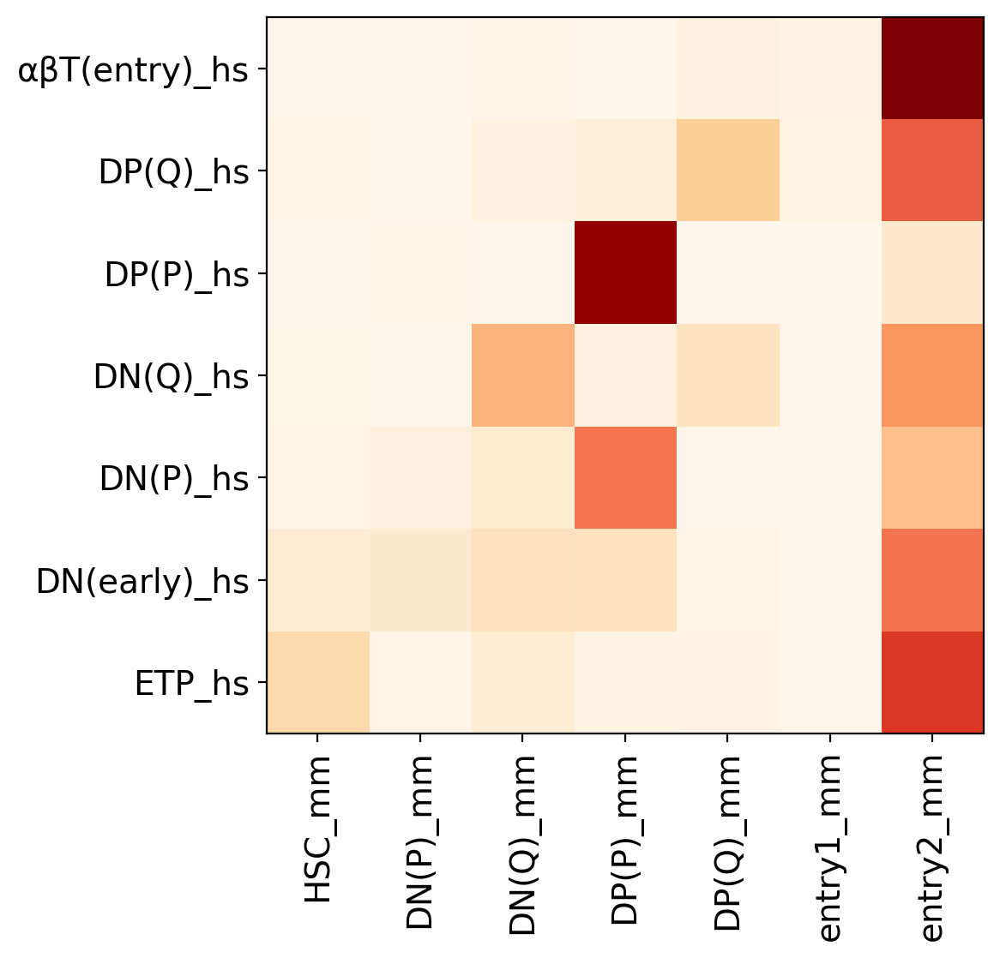

In [190]:
fig, ax = plt.subplots(figsize=(6,6))
im = ax.imshow(MtH_mean_proba[hs_index][:,mm_index])
plt.grid(False)

xlabel = lr_mouse.classes_[mm_index]
ylabel = lr_human.classes_[hs_index]

ax.set_xticks(np.arange(len(xlabel)))
ax.set_yticks(np.arange(len(ylabel)+1))

plt.ylim(-0.5,len(ylabel)-0.5)

ax.set_xticklabels(xlabel)
ax.set_yticklabels(ylabel)

plt.setp(ax.get_xticklabels(),rotation=90)

fig.tight_layout()
plt.grid(False)
scjp.jp_save_fig(version,'FigS1_developT_mouse_comp_MtH',fig_folder=fig_folder)

In [191]:
multi = MtH_mean_proba[hs_index][:,mm_index]*HtM_mean_proba[mm_index][:,hs_index].T

02_Output/HTA08.v01.A04.FigS1_developT_mouse_combi.pdf


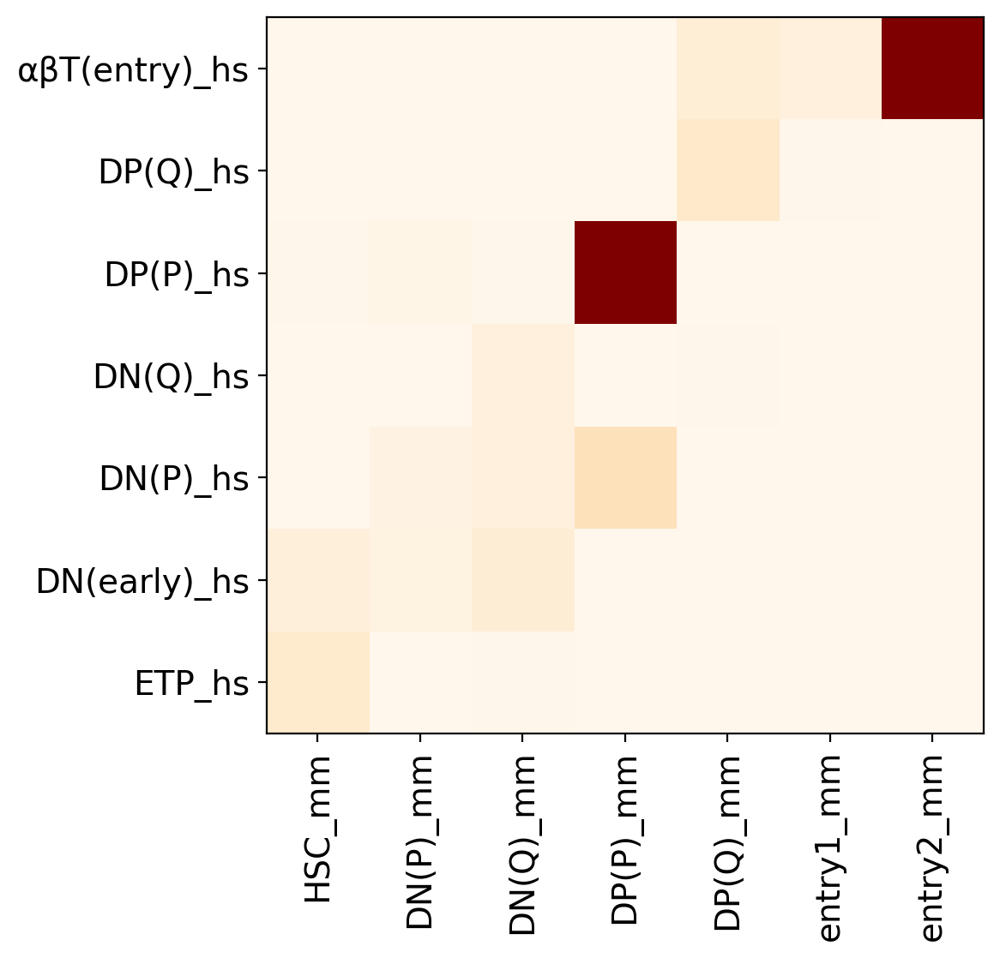

In [192]:
fig, ax = plt.subplots(figsize=(6,6))
im = ax.imshow(multi,vmax=0.4)
plt.grid(False)

xlabel = lr_mouse.classes_[mm_index]
ylabel = lr_human.classes_[hs_index]

ax.set_xticks(np.arange(len(xlabel)))
ax.set_yticks(np.arange(len(ylabel)+1))

plt.ylim(-0.5,len(ylabel)-0.5)

ax.set_xticklabels(xlabel)
ax.set_yticklabels(ylabel)

plt.setp(ax.get_xticklabels(),rotation=90)

fig.tight_layout()
plt.grid(False)
scjp.jp_save_fig(version,'FigS1_developT_mouse_combi',fig_folder=fig_folder)

In [271]:
T.obs['isDN(P)'] = T.obs['anno_merge'].isin('DN(P)_mm,DN(P)_hs,DN(early)_hs'.split(','))
T.obs['isDN(Q)'] = T.obs['anno_merge'].isin('DN(Q)_hs,DN(Q)_mm'.split(','))
T.obs['isDP(P)'] = T.obs['anno_merge'].isin('DP(P)_hs,DP(P)_mm'.split(','))
T.obs['isDP(Q)'] = T.obs['anno_merge'].isin('DP(Q)_hs,DP(Q)_mm'.split(','))
T.obs['isEntry'] = T.obs['anno_merge'].isin('αβT(entry)_hs,entry1_mm,entry2_mm'.split(','))
T.obs['isStem'] = T.obs['anno_merge'].isin('ETP_hs,HSC_mm'.split(','))
T.obs['isDN'] = T.obs['anno_merge'].isin('DN(P)_mm,DN(P)_hs,DN(early)_hs,DN(Q)_hs,DN(Q)_mm'.split(','))
T.obs['isDP'] = T.obs['anno_merge'].isin('DP(P)_mm,DP(P)_hs,DP(Q)_hs,DP(Q)_mm'.split(','))

In [272]:
T_hs = T[T.obs['name']=='hs']
T_hs.raw = T_hs

In [273]:
T_mm = T[T.obs['name']=='mm']
T_mm.raw = T_mm

In [132]:
#fc = defaultdict(lambda : defaultdict())

In [274]:
for ct in ['isDP']:
    print(ct)
    fc[ct]['hs'] = markers.volcano_plot(T_hs,ct,True,False)
    fc[ct]['mm'] = markers.volcano_plot(T_mm,ct,True,False)

isDP


In [ ]:
fc

/mnt/thymus_atlas/scjp/species.py:41: RuntimeWarning:

divide by zero encountered in log10

/mnt/thymus_atlas/scjp/species.py:42: RuntimeWarning:

divide by zero encountered in log10



02_Output/HTA08.v01.A04.FigS1_epi_isDP.pdf


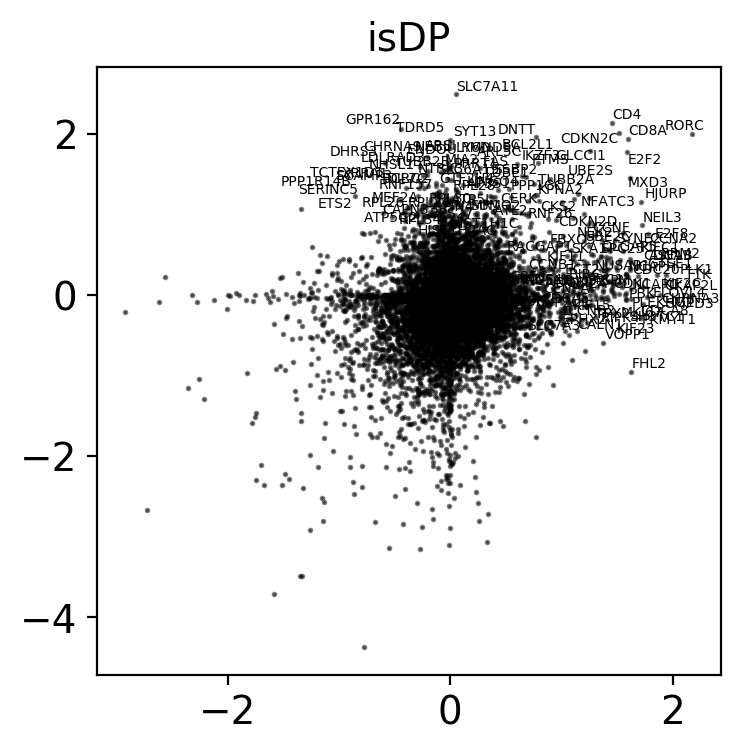

In [486]:
for ct in ['isDP']:
    species.draw_scatter_speices_ct(ct,fc,version,
                                    fig_folder,
                                   adjust_lim = 2)
    plt.show()

In [203]:
for ct in ['isDN(P)',
 'isDN(Q)',
 'isDP(P)',
 'isDP(Q)',
 'isEntry',
 'isStem']:
    print(ct)
    fc[ct]['hs'] = markers.volcano_plot(T_hs,ct,True,False)
    fc[ct]['mm'] = markers.volcano_plot(T_mm,ct,True,False)

isDP(Q)
isEntry


In [2]:
for ct in ['isDN','isDP']:
    species.draw_scatter_speices_ct(ct,fc,version,fig_folder,cc_genes=scjp.cc_genes)
    plt.show()

NameError: name 'species' is not defined

02_Output/HTA08.v01.A04.FigS1_epi_isDN(P).pdf


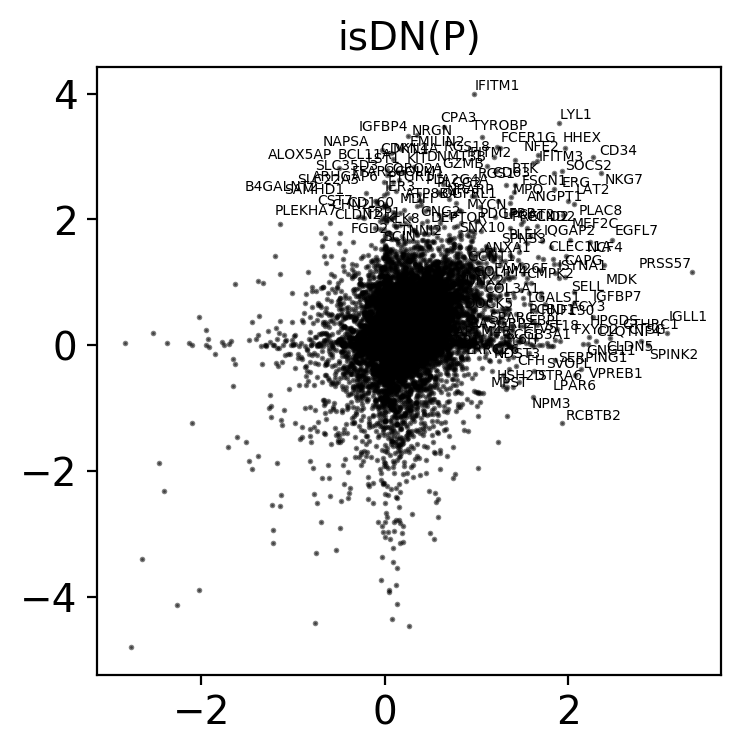

02_Output/HTA08.v01.A04.FigS1_epi_isDN(Q).pdf


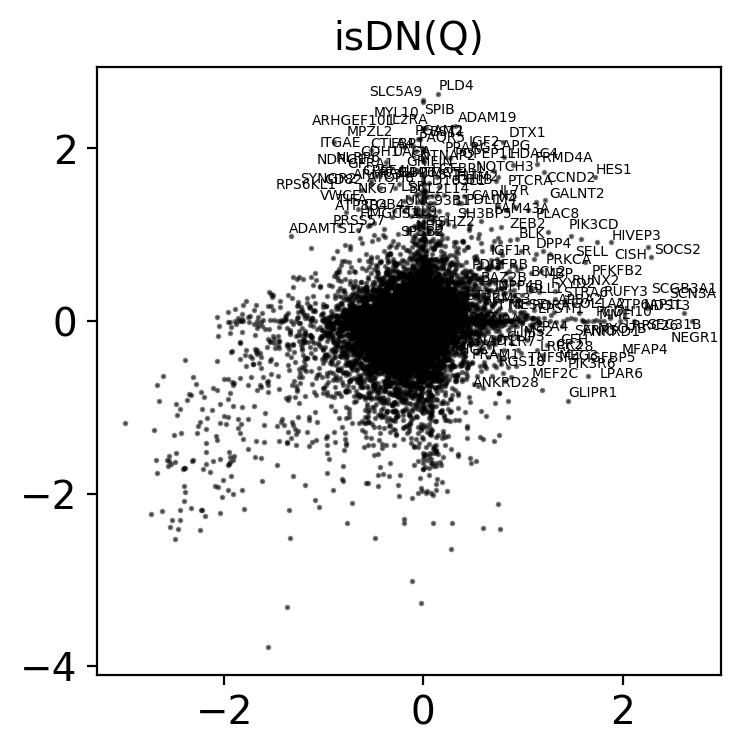

02_Output/HTA08.v01.A04.FigS1_epi_isDP(P).pdf


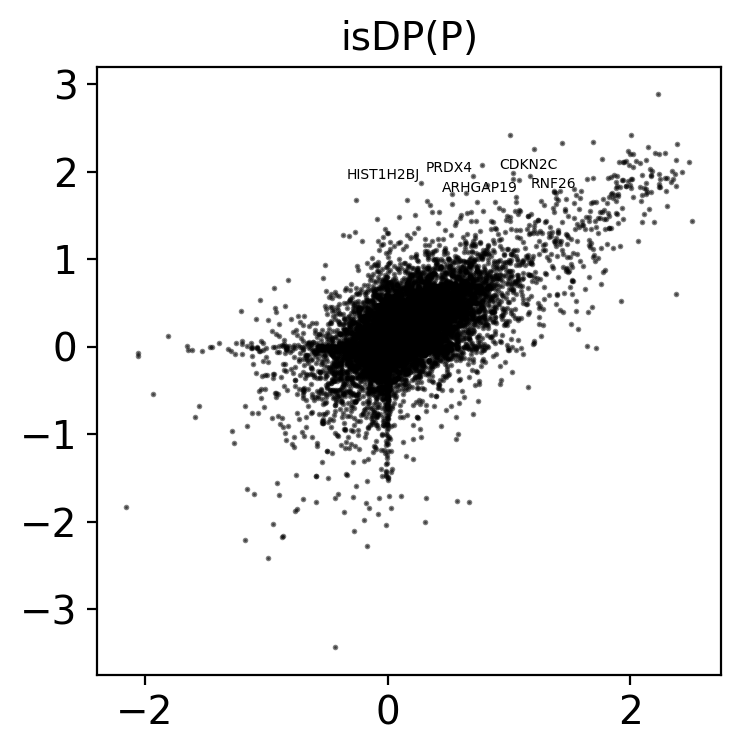

02_Output/HTA08.v01.A04.FigS1_epi_isDP(Q).pdf


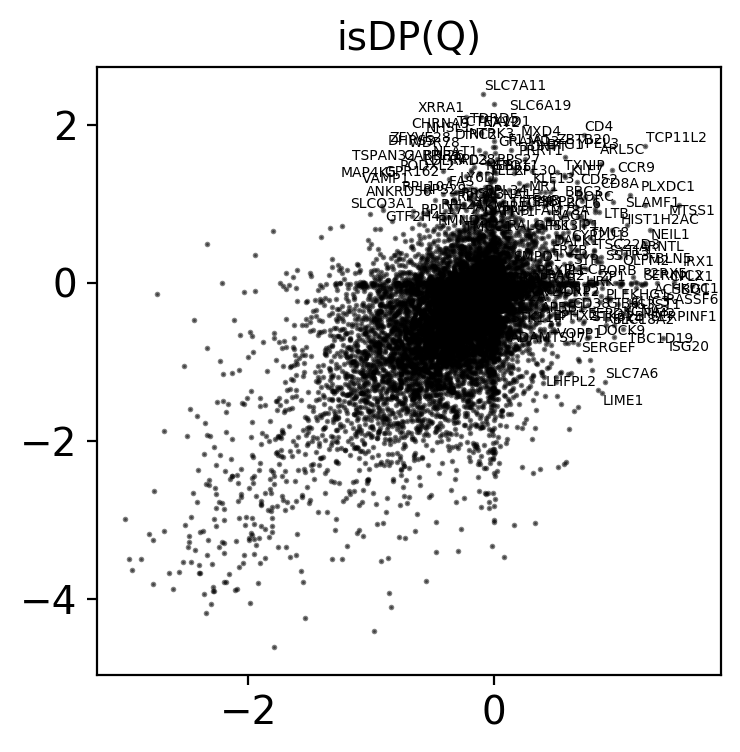

02_Output/HTA08.v01.A04.FigS1_epi_isEntry.pdf


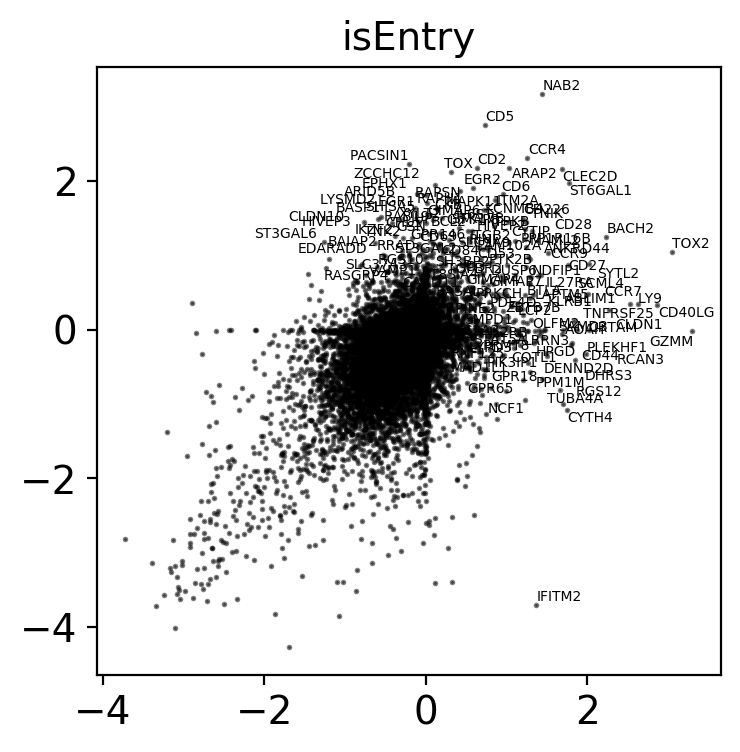

02_Output/HTA08.v01.A04.FigS1_epi_isStem.pdf


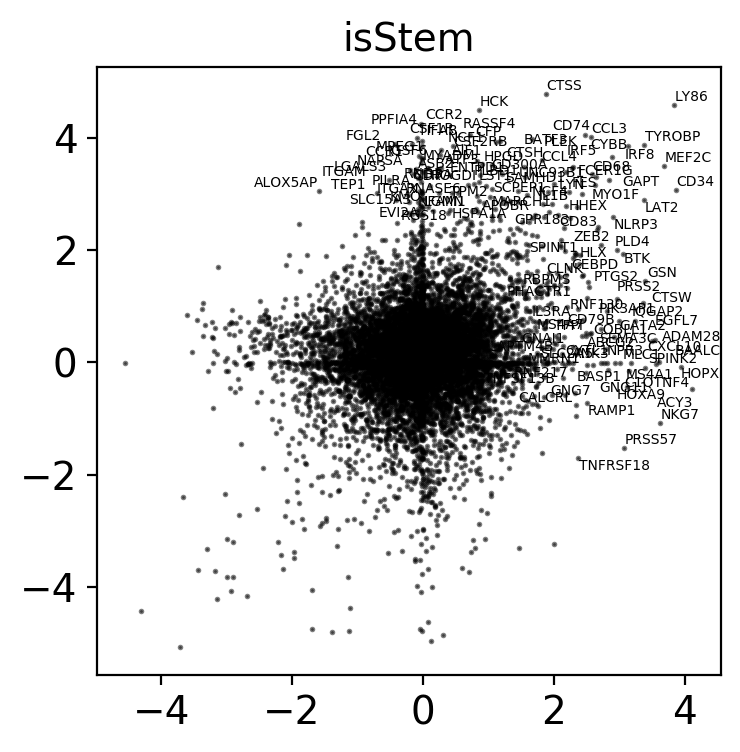

In [208]:
for ct in ['isDN(P)',
 'isDN(Q)',
 'isDP(P)',
 'isDP(Q)',
 'isEntry',
 'isStem']:
    species.draw_scatter_speices_ct(ct,fc,version,fig_folder,cc_genes=scjp.cc_genes)
    plt.show()

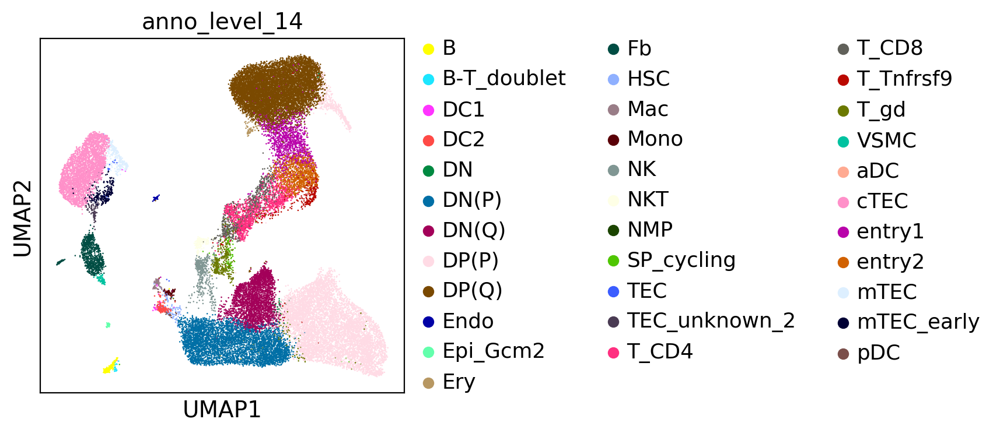

In [32]:
scjp.us(mm_jptca,'anno_level_14')

In [33]:
mm_jptca

AnnData object with n_obs × n_vars = 36168 × 2103 
    obs: 'Sample', 'n_counts', 'n_genes', 'donor', 'organ', 'sort', 'method', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'name', 'Cycle_score', 'isCycle', 'scrublet_doublets', 'leiden', 'anno_pred', 'anno_level_1', 'anno_level_2', 'anno_level_4', 'anno_level_5', 'anno_level_6', 'age', 'anno_level_7', 'anno_level_8', 'anno_level_9', 'trac.replaced.1', 'trac.replaced.2', 'trdc.replaced.1', 'trdc.replaced.2', 'trac.replaced.3', 'trac.replaced.4', 'trdc.replaced.3', 'trdc.replaced.4', 'trac.replaced.5', 'trac.replaced.6', 'trdc.replaced.5', 'trdc.replaced.6', 'trac.replaced.7', 'trac.replaced.8', 'trdc.replaced.7', 'trdc.replaced.8', 'trac.replaced.9', 'trac.replaced.10', 'trdc.replaced.9', 'trdc.replaced.10', 'trac.replaced.11', 'trac.replaced.12', 'trdc.replaced.11', 'trdc.replaced.12', 'trac.replaced.13', 'trac.replaced.14', 'trdc.replaced.13', 'trdc.replaced.14', 'trac.replaced.15', 'trdc.replaced.15', 'trac.replaced.16', 